# CAPSTONE PART 4: MODELLING

As with the EDA, I stil have a lot of commenting and cleaning to do in this notebook but this is the bones of what I have done so far. There is plenty more still to do but I wanted to get this to you as soon possible for review!

## Import Libraries

In [367]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import Imputer, StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict, train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, f1_score, accuracy_score, precision_score, roc_curve, auc
from sklearn.externals.six import StringIO
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn import svm, linear_model, datasets
from sklearn.naive_bayes import BernoulliNB, GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from scipy import stats
import statsmodels.formula.api as sm
from IPython.display import Image  
import pydotplus
import time

plt.style.use('ggplot')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [30]:
# import data
lang = pd.read_csv("/Users/lizspiking/GeneralAssembly/DSI5-lessons/projects/project-capstone/lang_0506.csv")

## Correlation Matrix

In [31]:
# correlation matrix
lang_corr = lang.corr()

In [32]:
# sort corraletaion matrix by 'Target_All' column
sorted_corr = lang_corr.sort_values('Target_All', ascending=False)

In [33]:
# select positively correlated features with correlation of 0.2 and above
features = list(sorted_corr.index[:60])

In [34]:
# select negatively correlated features with correlation of -0.2 and below
features2 = list(sorted_corr.index[352:])

In [35]:
# combine into one list to slice df
features.extend(features2)

My gridsearching has been taking a very long time so to speed things up in the short term, I will run my initial models against a subset of the data to identify which models work the best and then I will gridsearch on the couple of models that perform the best on the whole training data set.

In [36]:
# create df of highly correlated features for heatmap
correlated_features = lang.loc[:,features]

In [37]:
high_corr = correlated_features.corr()

In [38]:
# heatmap function to compare correlations
def heatmap_func(data):
    fig,ax = plt.subplots(figsize=(30,30))
    sns.set(font_scale=1.)

    mask = np.zeros_like(data, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    ax = sns.heatmap(data, ax=ax, cmap='coolwarm', center=0, annot=True, mask=mask);

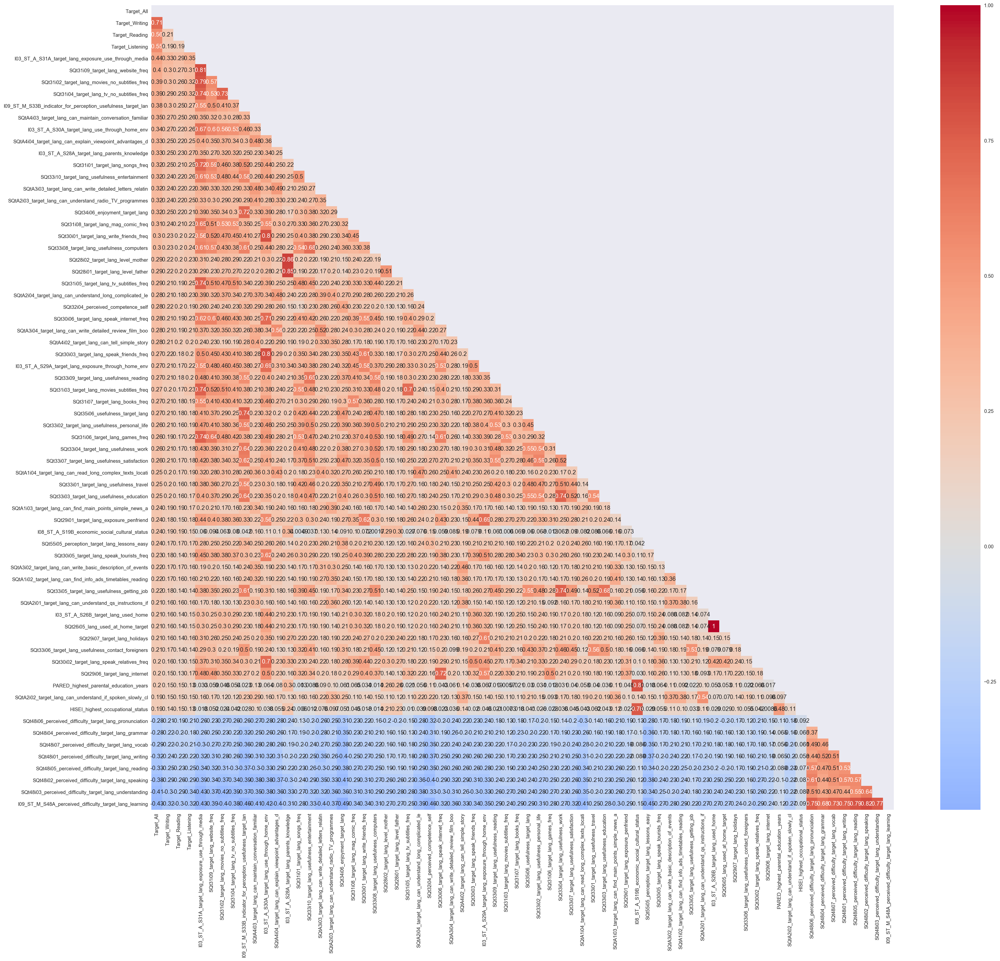

In [18]:
heatmap_func(high_corr)

#### Action
I need to clean up this heatmap!

In [39]:
# list of the features which are strongly co-correlated with other predictors
correlated_features = ['I03_ST_A_S31A_target_lang_exposure_use_through_media',\
                       'I03_ST_A_S30A_target_lang_use_through_home_env',\
                       'I03_ST_A_S28A_target_lang_parents_knowledge',\
                       'SQt33i04_target_lang_usefulness_work',\
                       'SQt33i03_target_lang_usefulness_education',\
                       'PARED_highest_parental_education_years']

Looking at the correlation between features within this heatmap, I have decided to remove correlated_features from my predictor matrix as they are very strongly correlated with other features.

In [40]:
# remove co-correlated features from list
final_features = [col for col in features if col not in correlated_features]

In [41]:
# sample 10000 rows from df to speed up gridsearching
lang_subset = lang.sample(n=10000, replace=False, random_state=7, axis=None)

In [42]:
# extract overall target and subset target
y_full = lang.pop('Target_All')
y = lang_subset.pop('Target_All')

In [43]:
# extract other target columns before dummifying
targets_full = lang.loc[:,['Target_Listening','Target_Reading','Target_Writing']].copy()
targets_subset = lang_subset.loc[:,['Target_Listening','Target_Reading','Target_Writing']].copy()

In [44]:
# drop targets from df
lang.drop(targets_full, axis=1, inplace=True)
lang_subset.drop(targets_subset, axis=1, inplace=True)

In [48]:
# set predictor matrices
X_full = lang.loc[:,final_features]
X = lang_subset.loc[:,final_features]

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1367: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
htt

In [49]:
# drop target variable and the discipline-specific targets which I used to create the overall target 
X.drop(['Target_All','Target_Writing','Target_Reading','Target_Listening'], axis=1, inplace=True)
X_full.drop(['Target_All','Target_Writing','Target_Reading','Target_Listening'], axis=1, inplace=True)

In [51]:
X.shape

(10000, 58)

## Dummify categorical variables

Am leaving this code here for when I want to add in more features that might need dummifying.

In [12]:
# check that I do want to dummify all object columns
#for_dummies = lang.select_dtypes(include=['object']).columns

In [13]:
# create dummies
#lang_dummies = pd.get_dummies(lang, prefix_sep='_', drop_first=True)
#lang.drop(for_dummies, axis=1, inplace=True)
#lang = pd.concat([lang, lang_dummies], axis=1)

In [14]:
# for clarity, rename overall predictor matrix to X
#X_all = lang

## Baseline Accuracy

In [52]:
# calculate baseline accuracy for each 
baseline = (y.value_counts().max())/y.count()
print(f'Overall baseline accuracy:\t{baseline.round(4)}')

Overall baseline accuracy:	0.6805


## Create train/test splits and scale data

For this first pass of the project I will look at predicting a single result ('Target_All') which encompasses each of the three disciplines tested ('Target_Listening', 'Target_Reading', 'Target_Writing'). As a follow up after my initial submission, one of the follow up actions will be to use my models to try to predict each of these specific sets of results.

In [53]:
y.shape

(10000,)

In [56]:
# create train/test split on sample
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,\
                                                    shuffle=True,\
                                                    stratify=y,\
                                                    random_state=7)

In [57]:
# instantiate StandardScaler and apply to predictors
ss = StandardScaler()
X_train_ss = ss.fit_transform(X_train)
X_test_ss = ss.transform(X_test)

In [60]:
# create train/test split on full dataset for gridsearching later
X_all_train, X_all_test, y_all_train, y_all_test = train_test_split(X_full, y_full,\
                                                                        test_size=0.3,\
                                                                        shuffle=True, random_state=7)

In [61]:
# instantiate StandardScaler and apply to predictors
ss = StandardScaler()
X_all_train_ss = ss.fit_transform(X_all_train)
X_all_test_ss = ss.transform(X_all_test)

## PCA

I set this up but ran out of time to use it so I will leave it in and run some models on iot before publishing the project.

In [157]:
# fit PCA on the predictors
pca = PCA(n_components=58)
pca.fit(X_train_ss)

PCA(copy=True, iterated_power='auto', n_components=58, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [158]:
# save components
lang_components = pca.components_

In [159]:
# check eigenvalues
print('Eigenvalues:')
pca.explained_variance_.round(4)

Eigenvalues:


array([1.64429e+01, 4.16360e+00, 3.02810e+00, 2.31880e+00, 2.14750e+00,
       1.79720e+00, 1.54940e+00, 1.39190e+00, 1.19560e+00, 1.12650e+00,
       9.86600e-01, 9.06200e-01, 8.66800e-01, 8.44300e-01, 7.96800e-01,
       7.24300e-01, 7.23000e-01, 7.02700e-01, 6.80900e-01, 6.64000e-01,
       6.44300e-01, 6.23900e-01, 5.98100e-01, 5.71900e-01, 5.64800e-01,
       5.50400e-01, 5.42300e-01, 5.31000e-01, 5.26900e-01, 5.13800e-01,
       5.03500e-01, 4.99500e-01, 4.91100e-01, 4.85800e-01, 4.60200e-01,
       4.53700e-01, 4.45400e-01, 4.35500e-01, 4.31100e-01, 4.19100e-01,
       4.07400e-01, 4.04300e-01, 3.79500e-01, 3.52900e-01, 3.45800e-01,
       3.34300e-01, 3.31400e-01, 3.12100e-01, 3.02100e-01, 2.81600e-01,
       2.79600e-01, 2.37400e-01, 2.21700e-01, 2.04600e-01, 1.34100e-01,
       1.21700e-01, 8.40000e-03, 0.00000e+00])

In [160]:
# review components
print('-------------------------------------\n')

for i, pc in enumerate(['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20']):
    print(pc, 'weighting vector:\n', lang_components[i])
    print('-------------------------------------\n')

-------------------------------------

PC1 weighting vector:
 [ 0.17651874  0.16973206  0.1596752   0.18181702  0.13314319  0.1339281
  0.14430925  0.16023814  0.13323405  0.12239118  0.15429845  0.14580235
  0.15562383  0.16009503  0.09998781  0.09128597  0.12959827  0.12715982
  0.11693037  0.14753455  0.11985478  0.10829294  0.14694125  0.15893378
  0.14566472  0.129979    0.1272114   0.13688989  0.14952579  0.13947056
  0.14637503  0.12033799  0.12703797  0.09894635  0.1312287   0.04522424
  0.11177364  0.12307939  0.09333102  0.09479543  0.12627448  0.08887364
  0.10253816  0.10253816  0.09410071  0.10903878  0.1237129   0.11855878
  0.08804479  0.02938267 -0.12292323 -0.1172802  -0.1307856  -0.1396108
 -0.14267436 -0.15672009 -0.15482953 -0.18099592]
-------------------------------------

PC2 weighting vector:
 [-0.13801103 -0.10097971 -0.08612592 -0.08816118  0.13592749  0.10077393
 -0.1761077  -0.16071687  0.11616332  0.11696214  0.04631425 -0.08223161
 -0.11142283 -0.18701172 

In [161]:
lang_exp_var_eigenvals = pca.explained_variance_
lang_exp_var_pct = pca.explained_variance_ratio_

print('Eigenvalues:\n', lang_exp_var_eigenvals, '\n')
print('Explained Variance pct:\n', lang_exp_var_pct)

Eigenvalues:
 [1.64428621e+01 4.16360980e+00 3.02807343e+00 2.31878098e+00
 2.14752471e+00 1.79716355e+00 1.54944155e+00 1.39194125e+00
 1.19560067e+00 1.12647053e+00 9.86576181e-01 9.06174289e-01
 8.66755775e-01 8.44303871e-01 7.96750291e-01 7.24261709e-01
 7.22964874e-01 7.02695368e-01 6.80894029e-01 6.64004442e-01
 6.44302965e-01 6.23931321e-01 5.98146029e-01 5.71940186e-01
 5.64825089e-01 5.50399460e-01 5.42327723e-01 5.30974754e-01
 5.26896329e-01 5.13810949e-01 5.03518547e-01 4.99540191e-01
 4.91052280e-01 4.85809304e-01 4.60211310e-01 4.53676137e-01
 4.45408727e-01 4.35476406e-01 4.31145638e-01 4.19127082e-01
 4.07388809e-01 4.04291532e-01 3.79537690e-01 3.52916139e-01
 3.45816524e-01 3.34311911e-01 3.31373210e-01 3.12110755e-01
 3.02136092e-01 2.81604643e-01 2.79585601e-01 2.37368740e-01
 2.21720170e-01 2.04575397e-01 1.34139704e-01 1.21672692e-01
 8.36744343e-03 3.24278278e-30] 

Explained Variance pct:
 [2.83457123e-01 7.17761206e-02 5.22007043e-02 3.99732711e-02
 3.70209986e

In [162]:
# transform data into new component variable matrix
lang_to_pcs  = pca.transform(X_train_ss)

In [163]:
lang_to_pcs.shape

(7000, 58)

In [164]:
# This transforms our original 20-dimensional data to 3-dimensional data
# The first row is the first student's transformed data.

print(lang_to_pcs[:,:3])

[[-1.94027113  0.67066454  0.02119738]
 [-2.36052158 -0.51366486  2.70687584]
 [-2.2123459   2.08086236 -0.91912852]
 ...
 [-2.83318119 -0.15624227 -0.77633417]
 [-2.01130006 -1.18515956  1.57341383]
 [-0.83751087 -0.1450662  -3.79853328]]


In [165]:
# keep in mind that each column in the transformed data is no longer correlated
print(np.corrcoef(lang_to_pcs.T))

[[ 1.00000000e+00  1.79111657e-15  1.64016354e-15 ...  5.12271098e-15
   3.90787164e-15  5.22808622e-02]
 [ 1.79111657e-15  1.00000000e+00 -4.16863165e-16 ... -1.88526307e-15
   2.52643730e-15  8.37338733e-02]
 [ 1.64016354e-15 -4.16863165e-16  1.00000000e+00 ...  1.44151357e-15
   1.91495085e-15 -5.41079439e-02]
 ...
 [ 5.12271098e-15 -1.88526307e-15  1.44151357e-15 ...  1.00000000e+00
  -4.83222949e-16 -1.66243695e-02]
 [ 3.90787164e-15  2.52643730e-15  1.91495085e-15 ... -4.83222949e-16
   1.00000000e+00 -2.81632375e-02]
 [ 5.22808622e-02  8.37338733e-02 -5.41079439e-02 ... -1.66243695e-02
  -2.81632375e-02  1.00000000e+00]]


In [166]:
# check correlations have been removed
np.allclose(np.corrcoef(lang_to_pcs.T),np.eye(len(lang_to_pcs.T)))

False

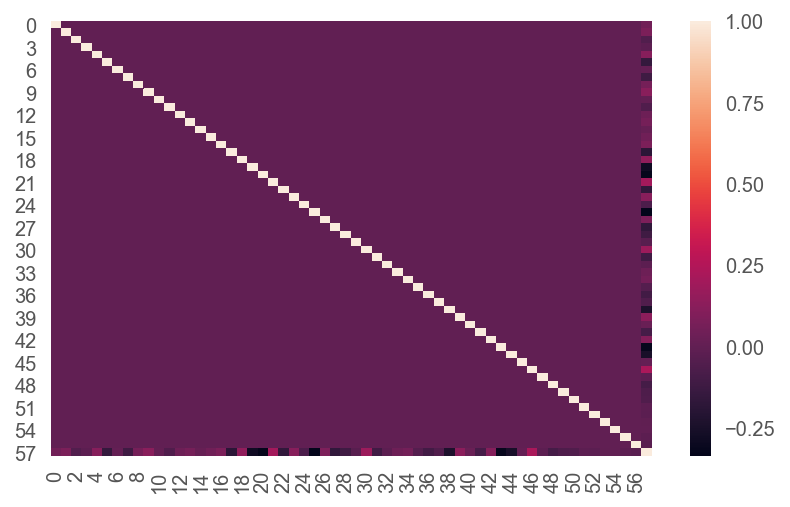

In [167]:
# plot heatmap to confirm 
sns.heatmap(np.corrcoef(lang_to_pcs.T))
plt.show()

In [168]:
# pairplots
#sns.pairplot(pd.DataFrame(lang_to_pcs, columns=['PC1','PC2','PC3','PC4','PC5',\
#                                                'PC6','PC7','PC8','PC9','PC10',\
#                                                'PC11','PC12','PC13','PC14','PC15',\
#                                                'PC16','PC17','PC18','PC19','PC20']), kind='reg');

In [202]:
y_df = pd.DataFrame(y_train)

In [204]:
y_df.shape

(7000, 1)

In [205]:
# Extract the principal components and put them into a dataframe
lang_dict = {'PC'+str(i+1) : pca.components_[i] for i in range(len(pca.components_))}
pca_df = pd.DataFrame(lang_dict,index=X_train.columns)

In [209]:
# create a DataFrame with the principal components
lang_to_pcs = pd.DataFrame(lang_to_pcs, 
                        columns=['PC'+str(i) for i in range(1, lang_to_pcs.shape[1]+1)])

lang_to_pcs['Target_All'] = y_train

In [213]:
y_train.value_counts()

0    4764
1    2236
Name: Target_All, dtype: int64

In [212]:
lang_to_pcs.Target_All.value_counts()

0.0    646
1.0    271
Name: Target_All, dtype: int64

In [210]:
pca_df.shape

(58, 58)

In [200]:
pca_df.head()

,PC1,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC2,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC3,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC4,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC5,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC6,PC7,PC8,PC9,Target_All
SQt31i09_target_lang_website_freq,0.176519,-0.147394,-0.034126,0.064119,0.075974,0.006204,-0.059459,-0.040375,0.026528,-0.018115,0.041404,-0.138011,0.032494,-0.023147,-0.041608,-0.121015,0.034744,0.139720,-0.024797,0.122996,-0.026844,-0.034896,0.044825,-0.085040,-0.009543,0.019886,0.138886,0.097035,0.002645,0.026529,0.022395,0.025319,-0.104420,-0.022565,-0.212421,-0.013059,0.002434,0.016933,0.135953,-0.239768,-0.228588,-0.166196,0.692087,0.103114,-0.132522,-0.089804,-0.229185,0.095732,0.062105,-0.046343,0.023873,-0.039740,0.002746,-2.159655e-17,0.071956,-0.035433,-0.076588,0.046566,NaN
SQt31i02_target_lang_movies_no_subtitles_freq,0.169732,-0.092035,0.015747,-0.024574,-0.084281,-0.002413,0.010064,-0.099072,-0.088724,-0.079018,-0.050093,-0.100980,-0.093938,0.110023,0.043231,0.288124,-0.023785,0.003508,-0.005135,0.112441,-0.155509,-0.068325,0.146395,-0.172938,0.175145,0.012858,0.129407,0.140390,0.057987,-0.025616,0.004365,-0.026532,0.016502,-0.006295,0.143073,0.060832,0.031521,0.070964,-0.101600,0.227872,0.253762,0.222323,0.157546,-0.063005,-0.095492,-0.031335,0.081671,-0.041586,-0.011267,-0.578515,0.017750,0.026210,-0.000224,6.528910e-17,0.044816,0.097351,-0.077975,-0.198704,NaN
SQt31i04_target_lang_tv_no_subtitles_freq,0.159675,-0.103711,0.065225,-0.002613,-0.115863,0.027830,0.051193,-0.144422,-0.111289,-0.079733,-0.076677,-0.086126,-0.101790,0.097553,0.086048,0.415549,-0.034208,-0.080716,0.023045,0.090999,-0.131392,-0.078683,0.156398,-0.183642,0.138654,0.080271,0.102661,0.143852,-0.076209,-0.037800,-0.061810,-0.027813,-0.015959,-0.021256,0.088435,0.036048,-0.022040,0.046473,0.085801,-0.154975,-0.182792,-0.140493,-0.165630,0.019293,-0.074330,-0.010896,0.001220,0.029753,-0.023795,0.556783,-0.041956,-0.013151,-0.000477,-2.571904e-17,0.053287,0.092771,-0.069143,-0.250731,NaN
I09_ST_M_S33B_indicator_for_perception_usefulness_target_lan,0.181817,0.020614,-0.109565,-0.164826,0.027979,0.036034,-0.045156,-0.147710,-0.028320,-0.124120,-0.053757,-0.088161,-0.181654,-0.081316,-0.045928,-0.002021,-0.021543,0.038191,-0.091930,-0.057532,0.001024,0.056210,-0.233988,-0.002555,0.009405,-0.017978,0.007232,0.010373,-0.021318,0.042750,0.005255,0.004140,0.001788,0.115959,-0.018960,-0.032697,-0.005423,-0.007680,-0.009110,0.004577,-0.056134,-0.008244,0.005183,-0.005155,0.094648,0.022863,0.016233,0.030968,0.076849,0.021534,0.031849,0.845464,-0.008445,4.683884e-17,-0.024096,0.033102,0.057244,0.045269,NaN
SQtA4i03_target_lang_can_maintain_conversation_familiar,0.133143,0.061548,-0.128492,0.006953,0.020734,-0.070086,0.122194,-0.060317,-0.009948,0.049571,0.380093,0.135927,0.004455,0.021345,-0.332075,0.042284,0.023494,0.048961,0.165104,-0.164421,-0.251201,0.172899,-0.028069,0.264449,0.332338,0.128253,0.273445,-0.128706,0.008552,-0.093794,-0.096768,-0.091330,-0.099578,-0.154378,0.069114,-0.199522,0.247916,0.034595,0.049613,-0.013397,-0.035684,0.012109,-0.015744,0.000824,-0.102475,0.058200,-0.000634,-0.004004,0.004923,0.012380,0.006628,-0.017098,-0.001737,-2.493942e-17,-0.117333,0.099973,0.079073,0.066831,NaN


In [173]:
X_train_ss.shape, lang_exp_var_pct.shape

((7000, 58), (58,))

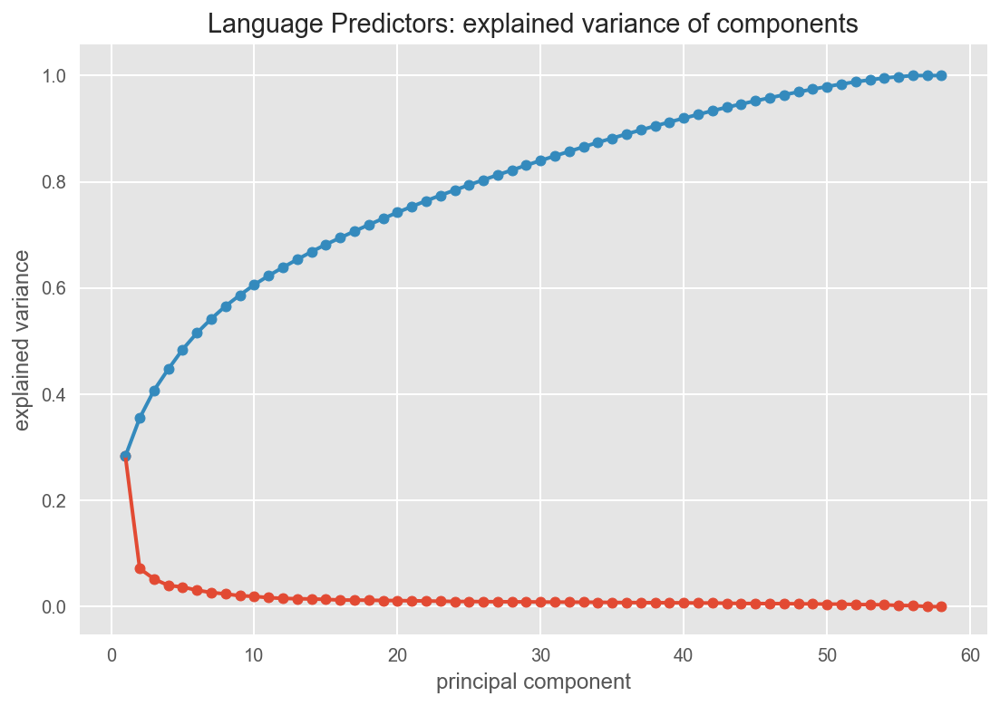

In [181]:
fig, ax = plt.subplots(figsize=(8,6))

x_values = list(range(1, pca.n_components_+1))

ax.plot(x_values, pca.explained_variance_ratio_, lw=2)
ax.scatter(x_values, pca.explained_variance_ratio_, s=30)
ax.plot(x_values, np.cumsum(pca.explained_variance_ratio_), lw=2)
ax.scatter(x_values, np.cumsum(pca.explained_variance_ratio_), s=30)
ax.set_title('Language Predictors: explained variance of components')
ax.set_xlabel('principal component')
ax.set_ylabel('explained variance')
plt.show()

In [186]:
pd.DataFrame(pca.components_.T, index=X_train.columns)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57
SQt31i09_target_lang_website_freq,0.176519,-0.138011,0.044825,-0.022565,-0.132522,0.071956,-0.035433,-0.076588,0.046566,-0.147394,-0.034126,0.064119,0.075974,0.006204,-0.059459,-0.040375,0.026528,-0.018115,0.041404,0.032494,-0.023147,-0.041608,-0.121015,0.034744,0.139720,-0.024797,0.122996,-0.026844,-0.034896,-0.085040,-0.009543,0.019886,0.138886,0.097035,0.002645,0.026529,0.022395,0.025319,-0.104420,-0.212421,-0.013059,0.002434,0.016933,0.135953,-0.239768,-0.228588,-0.166196,0.692087,0.103114,-0.089804,-0.229185,0.095732,0.062105,-0.046343,0.023873,-0.039740,0.002746,-2.159655e-17
SQt31i02_target_lang_movies_no_subtitles_freq,0.169732,-0.100980,0.146395,-0.006295,-0.095492,0.044816,0.097351,-0.077975,-0.198704,-0.092035,0.015747,-0.024574,-0.084281,-0.002413,0.010064,-0.099072,-0.088724,-0.079018,-0.050093,-0.093938,0.110023,0.043231,0.288124,-0.023785,0.003508,-0.005135,0.112441,-0.155509,-0.068325,-0.172938,0.175145,0.012858,0.129407,0.140390,0.057987,-0.025616,0.004365,-0.026532,0.016502,0.143073,0.060832,0.031521,0.070964,-0.101600,0.227872,0.253762,0.222323,0.157546,-0.063005,-0.031335,0.081671,-0.041586,-0.011267,-0.578515,0.017750,0.026210,-0.000224,6.528910e-17
SQt31i04_target_lang_tv_no_subtitles_freq,0.159675,-0.086126,0.156398,-0.021256,-0.074330,0.053287,0.092771,-0.069143,-0.250731,-0.103711,0.065225,-0.002613,-0.115863,0.027830,0.051193,-0.144422,-0.111289,-0.079733,-0.076677,-0.101790,0.097553,0.086048,0.415549,-0.034208,-0.080716,0.023045,0.090999,-0.131392,-0.078683,-0.183642,0.138654,0.080271,0.102661,0.143852,-0.076209,-0.037800,-0.061810,-0.027813,-0.015959,0.088435,0.036048,-0.022040,0.046473,0.085801,-0.154975,-0.182792,-0.140493,-0.165630,0.019293,-0.010896,0.001220,0.029753,-0.023795,0.556783,-0.041956,-0.013151,-0.000477,-2.571904e-17
I09_ST_M_S33B_indicator_for_perception_usefulness_target_lan,0.181817,-0.088161,-0.233988,0.115959,0.094648,-0.024096,0.033102,0.057244,0.045269,0.020614,-0.109565,-0.164826,0.027979,0.036034,-0.045156,-0.147710,-0.028320,-0.124120,-0.053757,-0.181654,-0.081316,-0.045928,-0.002021,-0.021543,0.038191,-0.091930,-0.057532,0.001024,0.056210,-0.002555,0.009405,-0.017978,0.007232,0.010373,-0.021318,0.042750,0.005255,0.004140,0.001788,-0.018960,-0.032697,-0.005423,-0.007680,-0.009110,0.004577,-0.056134,-0.008244,0.005183,-0.005155,0.022863,0.016233,0.030968,0.076849,0.021534,0.031849,0.845464,-0.008445,4.683884e-17
SQtA4i03_target_lang_can_maintain_conversation_familiar,0.133143,0.135927,-0.028069,-0.154378,-0.102475,-0.117333,0.099973,0.079073,0.066831,0.061548,-0.128492,0.006953,0.020734,-0.070086,0.122194,-0.060317,-0.009948,0.049571,0.380093,0.004455,0.021345,-0.332075,0.042284,0.023494,0.048961,0.165104,-0.164421,-0.251201,0.172899,0.264449,0.332338,0.128253,0.273445,-0.128706,0.008552,-0.093794,-0.096768,-0.091330,-0.099578,0.069114,-0.199522,0.247916,0.034595,0.049613,-0.013397,-0.035684,0.012109,-0.015744,0.000824,0.058200,-0.000634,-0.004004,0.004923,0.012380,0.006628,-0.017098,-0.001737,-2.493942e-17
SQtA4i04_target_lang_can_explain_viewpoint_advantages_d,0.133928,0.100774,0.082808,-0.061803,-0.149826,-0.111164,0.277288,0.194657,0.078103,0.083786,-0.057330,0.054020,-0.011331,0.002942,0.016768,0.009066,-0.058678,0.034305,0.037502,-0.018341,0.054343,-0.156761,-0.102384,0.112924,-0.051954,0.162978,-0.150893,0.104676,-0.133981,-0.160292,0.308059,-0.185261,-0.156858,-0.095226,-0.356843,0.079458,0.134888,0.074158,-0.014847,-0.014266,0.244335,-0.488213,0.021996,-0.058288,-0.002658,-0.006711,-0.018553,0.056355,0.007632,0.000908,0.039859,0.001629,0.010197,-0.006211,-0.008547,0.005547,-0.000342,2.456817e-17
SQt31i01_target_lang_songs_freq,0.144309,-0.176108,-0.063015,-0.009895,-0.126413,0.068988,0.015652,-0.159447,0.019716,0.009878,-0.203657,-0.013438,0.136925,-0.175269,-0.167213,0.039906,0.113218,-0.099503,0.025762

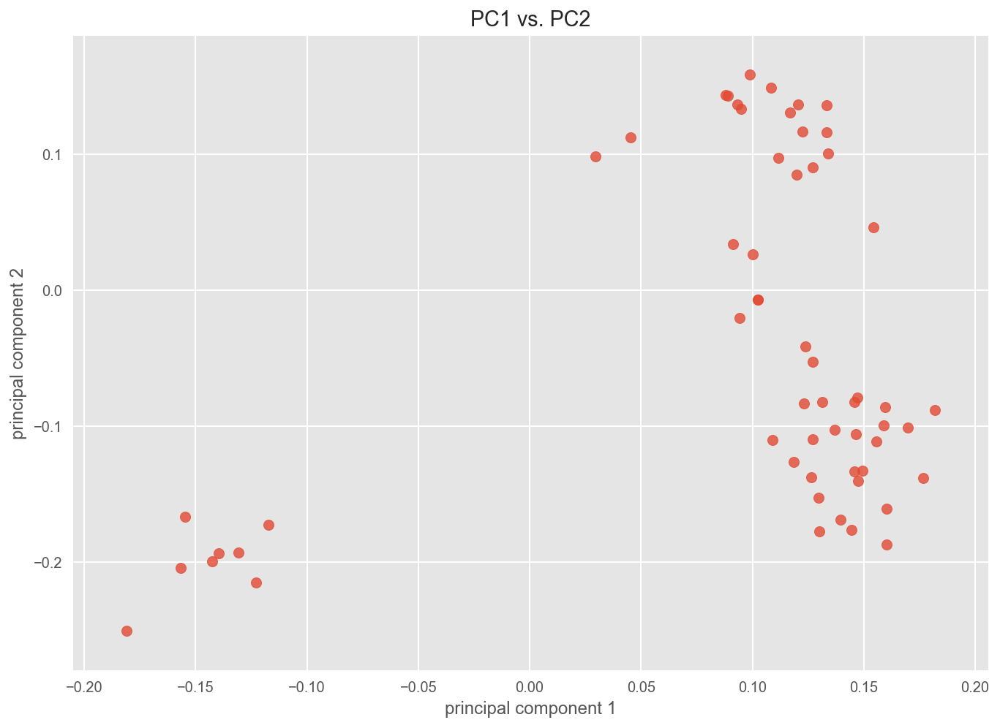

In [189]:
# plot PC1 against PC2
fig, ax = plt.subplots(figsize=(10,8))
ax.scatter(pca_df.PC1, pca_df.PC2, alpha=0.8)

ax.set_title('PC1 vs. PC2')
ax.set_xlabel('principal component 1')
ax.set_ylabel('principal component 2')
plt.show()

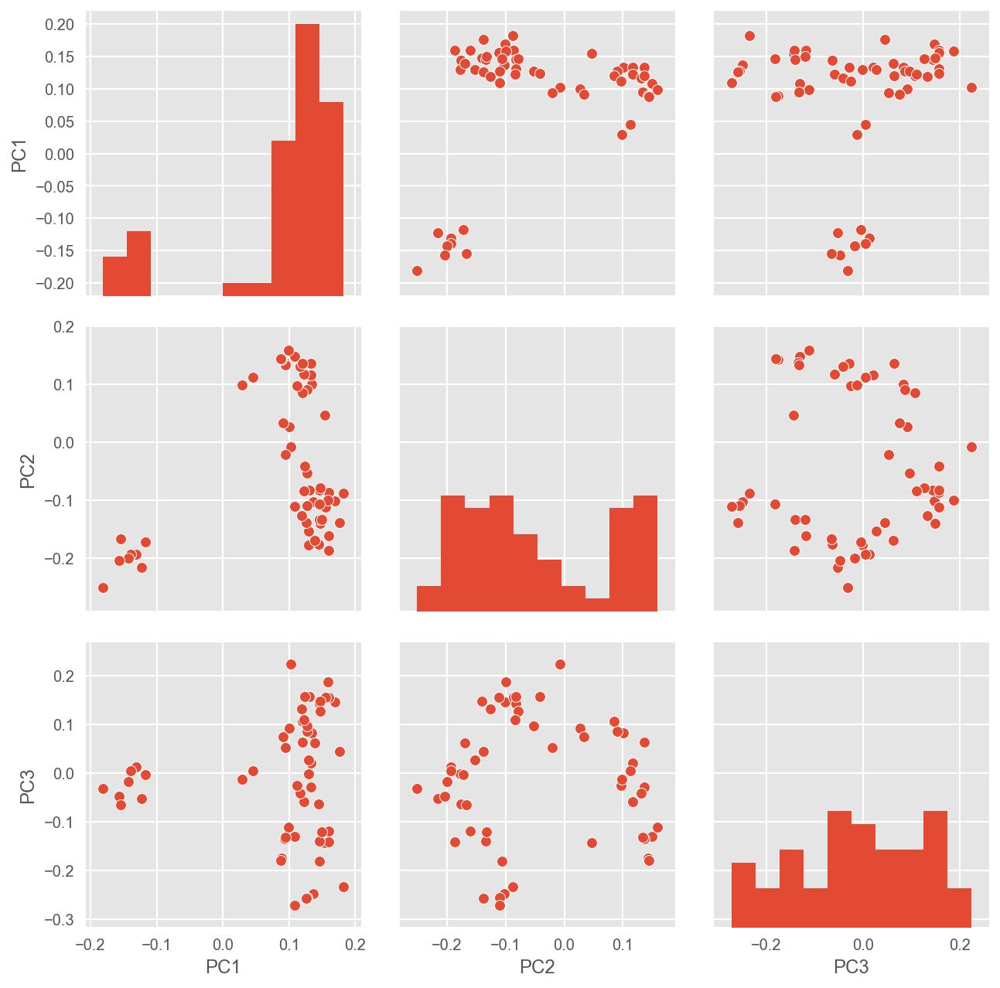

In [424]:
sns.pairplot(data=pca_df, vars=['PC1','PC2','PC3'], size=3);

## Gridsearch on Sample Subset (10k observations)

In [219]:
def print_cm_cr(y_true, y_pred):
    """prints the confusion matrix and the classification report"""
    confusion = pd.crosstab(y_true, y_pred, rownames=['Actual'], colnames=[
                            'Predicted'], margins=True)
    print(confusion)
    print()
    print(classification_report(y_true, y_pred))

Link to notebook with original function (I will delete this once I'm comfortable I haven't forgotten anything!)

http://localhost:8888/notebooks/DSI5-lessons/week11/day2_support_vector_machines/support-vector-machines-lab-2/solution-code/svm-lab-solution-code.ipynb

In [233]:
# function to generalise gridsearch and scoring
def grid_search_func(estimator, params, X_train, y_train,\
                     X_test, y_test, scoring_function=accuracy_score,\
                     scoring='accuracy'):
    gs = GridSearchCV(
        estimator=estimator,
        param_grid=params,
        n_jobs=6, cv=4,
        return_train_score=True,
        scoring=scoring,
        verbose=2)

    gs.fit(X_train, y_train)

    print("Best score:")
    print(gs.best_score_)
    print()
    print("Best estimator:")
    print(gs.best_estimator_.get_params())
    print()

    predictions = gs.best_estimator_.predict(X_test)
    print('Test score: ', scoring_function(y_test, predictions))
    print()
    print_cm_cr(y_test, predictions)

    return gs

### Logistic Regression

In [283]:
# initiate model and cross validate
model_lr = LogisticRegression(solver='lbfgs')
model_lr.fit(X_train_ss, y_train)
predictions_lr = model_lr.predict(X_test_ss)

print('Mean Cross Val Score:\t', cross_val_score(model_lr, X_train_ss, y_train, cv=5).mean())
#print('Score (Test Data):\t', lr.score(X_test_ss, y_test))
print('Accuracy Score:\t', accuracy_score(y_test, predictions_lr))

Mean Cross Val Score:	 0.818574045336612
Accuracy Score:	 0.8176666666666667


In [296]:
# instantiate Logistic Regression
lr = LogisticRegression()

In [297]:
# create a hyperparameter dictionary for logistic regression
lr_params = {'penalty':['l2'],\
             'solver':['lbfgs', 'sag'],\
             'C':np.logspace(-3,2,5)}

#### Action
Gridsearch keeps getting stuck so I need to figure out how to tune it to run successfully.

In [300]:
# run gridsearch for Logistic Regression
#gs_lr = grid_search_func(lr,lr_params,\
#                         X_train_ss,y_train,X_test_ss,y_test)

### KNN Classifier

In [ ]:
#### Try KNN with cosine similarity as distance metric for multiclass?

In [74]:
# instantiate KNN model
model_knn = KNeighborsClassifier()

In [75]:
# set hyperparameters for gridsearch
params_knn = {'n_neighbors':list(range(1,21,3)),
              'weights':['distance','uniform']}

In [79]:
# run gridsearch for KNN
gs_knn = grid_search_func(model_knn, params_knn,\
                          X_train_ss, y_train, X_test_ss, y_test)

Fitting 4 folds for each of 14 candidates, totalling 56 fits
[CV] n_neighbors=1, weights=distance .................................
[CV] n_neighbors=1, weights=distance .................................
[CV] n_neighbors=1, weights=distance .................................
[CV] n_neighbors=1, weights=distance .................................
[CV] n_neighbors=1, weights=uniform ..................................
[CV] n_neighbors=1, weights=uniform ..................................
[CV] n_neighbors=1, weights=uniform ..................................
[CV] n_neighbors=1, weights=uniform ..................................
[CV] .................. n_neighbors=1, weights=distance, total=   3.1s
[CV] .................. n_neighbors=1, weights=distance, total=   3.1s
[CV] n_neighbors=4, weights=distance .................................
[CV] n_neighbors=4, weights=distance .................................
[CV] .................. n_neighbors=1, weights=distance, total=   3.1s
[CV] n_neighbors

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   40.0s


[CV] n_neighbors=13, weights=uniform .................................
[CV] .................. n_neighbors=10, weights=uniform, total=   3.0s
[CV] n_neighbors=13, weights=uniform .................................
[CV] ................. n_neighbors=13, weights=distance, total=   3.1s
[CV] ................. n_neighbors=13, weights=distance, total=   3.1s
[CV] n_neighbors=16, weights=distance ................................
[CV] n_neighbors=16, weights=distance ................................
[CV] ................. n_neighbors=13, weights=distance, total=   3.1s
[CV] n_neighbors=16, weights=distance ................................
[CV] ................. n_neighbors=13, weights=distance, total=   3.0s
[CV] n_neighbors=16, weights=distance ................................
[CV] .................. n_neighbors=13, weights=uniform, total=   3.0s
[CV] n_neighbors=16, weights=uniform .................................
[CV] .................. n_neighbors=13, weights=uniform, total=   3.1s
[CV] n

[Parallel(n_jobs=-1)]: Done  56 out of  56 | elapsed:  1.3min finished


Best score:
0.8062857142857143

Best estimator:
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': 1, 'n_neighbors': 19, 'p': 2, 'weights': 'distance'}

Test score:  0.7976666666666666

Predicted     0    1   All
Actual                    
0          1723  318  2041
1           289  670   959
All        2012  988  3000

             precision    recall  f1-score   support

          0       0.86      0.84      0.85      2041
          1       0.68      0.70      0.69       959

avg / total       0.80      0.80      0.80      3000



### Linear SVM

In [301]:
# instantiate linear SVC
model_lin = svm.LinearSVC()

In [302]:
# set hyperparameters for gridsearch
params_lin = {'C': np.logspace(-10, 10, 21),
              'fit_intercept': [True, False]}

In [303]:
# run gridsearch function for Linear SVM
gs_lin = grid_search_func(model_lin, params_lin,
                          X_train_ss, y_train, X_test_ss, y_test,
                          scoring_function=accuracy_score,
                          scoring='accuracy')

Fitting 4 folds for each of 42 candidates, totalling 168 fits
[CV] C=1e-10, fit_intercept=True .....................................
[CV] C=1e-10, fit_intercept=True .....................................
[CV] C=1e-10, fit_intercept=True .....................................
[CV] C=1e-10, fit_intercept=True .....................................
[CV] C=1e-10, fit_intercept=False ....................................
[CV] C=1e-10, fit_intercept=False ....................................
[CV] C=1e-10, fit_intercept=False ....................................
[CV] C=1e-10, fit_intercept=False ....................................
[CV] C=1e-09, fit_intercept=True .....................................
[CV] C=1e-09, fit_intercept=True .....................................
[CV] C=1e-09, fit_intercept=True .....................................
[CV] C=1e-09, fit_intercept=True .....................................


Process ForkPoolWorker-456:
Process ForkPoolWorker-459:
Process ForkPoolWorker-461:
Process ForkPoolWorker-460:
Process ForkPoolWorker-458:
Process ForkPoolWorker-457:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/lizspiking/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/lizspiking/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/lizspiking/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/lizspiking/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/lizspiking/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/Users/lizspiking/anacon

KeyboardInterrupt: 

In [ ]:
# run gridsearch function for Linear SVM with precision scoring
gs_lin_pr = grid_search_func(model_lin, params_lin,
                          X_train_ss, y_train, X_test_ss, y_test,
                          scoring_function=precision_score,
                          scoring='precision')

#### Action
Gridsearch keeps stalling on this model too; figure out how to tune it to allow it to run sucessfully.

In [ ]:
#model_lin.fit()

### Support Vector Classifier with rbf kernel

In [224]:
# instantiate SVM with rbf kernel
model_rbf = svm.SVC(kernel='rbf')

In [225]:
# create hyperparameter dictionary for gridsearch
params_rbf = {'C': np.logspace(-3,2,5),
              'gamma':np.logspace(-5,2,5)}

In [226]:
# run gridsearch function for SVM with rbf kernel
gs_rbf = grid_search_func(model_rbf, params_rbf,\
                          X_train_ss, y_train, X_test_ss, y_test)

Fitting 4 folds for each of 25 candidates, totalling 100 fits
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=   5.4s
[CV] ............................. C=0.001, gamma=1e-05, total=   5.4s
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............................. C=0.001, gamma=1e-05, total=   5.4s
[CV] C=0.001, g

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   30.2s


[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.0s
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.0s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.0s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.0s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=   6.9s
[CV] ............... C=0.01778279410038923, gamma=100.0, total=   6.2s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=   7.0s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .

[CV] ............. C=100.0, gamma=0.0005623413251903491, total=   3.9s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............. C=100.0, gamma=0.0005623413251903491, total=   3.9s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=   6.3s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=   6.3s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=   6.3s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=   6.2s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=   7.0s
[CV] ................ C=100.0, gamma=1.7782794100389228, total=   7.1s
[CV] .

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.7min finished


Best score:
0.8211428571428572

Best estimator:
{'C': 100.0, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.0005623413251903491, 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}

Test score:  0.81

Predicted     0    1   All
Actual                    
0          1838  203  2041
1           367  592   959
All        2205  795  3000

             precision    recall  f1-score   support

          0       0.83      0.90      0.87      2041
          1       0.74      0.62      0.68       959

avg / total       0.81      0.81      0.80      3000



In [227]:
# run gridsearch function for SVM with rbf kernel and precision scoring
gs_rbf_pr = grid_search_func(model_rbf, params_rbf,
                          X_train_ss, y_train, X_test_ss, y_test,
                          scoring_function=precision_score,
                          scoring='precision')

Fitting 4 folds for each of 25 candidates, totalling 100 fits
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................


/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/

[CV] ............................. C=0.001, gamma=1e-05, total=   5.4s
[CV] ............................. C=0.001, gamma=1e-05, total=   5.4s
[CV] ............................. C=0.001, gamma=1e-05, total=   5.4s
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............................. C=0.001, gamma=1e-05, total=   5.4s
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............. C=0.001, gamma=0.0005623413251903491, total=   5.4s
[CV] ............. C=0.001, gamma=0.0005623413251903491, total=   5.4s
[CV] C=0.001, gamma=1.7782794100389228 ...............................
[CV] C=0.001, gamma=1.7782794100389228 ...............................
[CV] ............. C=0.001, gamma=0.0005623413251903491, total=   5.4s
[CV] C=0.001, gamma=1.7782794100389228 ...............................
[CV] .

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/

[CV] ............... C=0.001, gamma=0.03162277660168379, total=   5.0s
[CV] C=0.001, gamma=100.0 ............................................
[CV] ............... C=0.001, gamma=0.03162277660168379, total=   5.0s
[CV] C=0.001, gamma=100.0 ............................................
[CV] ............... C=0.001, gamma=0.03162277660168379, total=   5.0s
[CV] C=0.001, gamma=100.0 ............................................
[CV] ............... C=0.001, gamma=0.03162277660168379, total=   5.1s
[CV] C=0.001, gamma=100.0 ............................................
[CV] ................ C=0.001, gamma=1.7782794100389228, total=   6.3s
[CV] C=0.01778279410038923, gamma=1e-05 ..............................
[CV] ................ C=0.001, gamma=1.7782794100389228, total=   6.3s
[CV] C=0.01778279410038923, gamma=1e-05 ..............................
[CV] ................ C=0.001, gamma=1.7782794100389228, total=   6.3s
[CV] C=0.01778279410038923, gamma=1e-05 ..............................
[CV] .

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/

[CV] ............................. C=0.001, gamma=100.0, total=   5.6s
[CV] C=0.01778279410038923, gamma=0.0005623413251903491 ..............
[CV] ............................. C=0.001, gamma=100.0, total=   5.7s
[CV] C=0.01778279410038923, gamma=0.0005623413251903491 ..............
[CV] ............................. C=0.001, gamma=100.0, total=   5.7s
[CV] C=0.01778279410038923, gamma=0.0005623413251903491 ..............
[CV] ............................. C=0.001, gamma=100.0, total=   5.7s
[CV] C=0.01778279410038923, gamma=0.0005623413251903491 ..............
[CV] ............... C=0.01778279410038923, gamma=1e-05, total=   4.4s
[CV] C=0.01778279410038923, gamma=0.03162277660168379 ................
[CV] ............... C=0.01778279410038923, gamma=1e-05, total=   4.4s
[CV] C=0.01778279410038923, gamma=0.03162277660168379 ................
[CV] ............... C=0.01778279410038923, gamma=1e-05, total=   4.4s
[CV] C=0.01778279410038923, gamma=0.03162277660168379 ................
[CV] .

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


[CV]  C=0.01778279410038923, gamma=0.0005623413251903491, total=   5.4s
[CV] C=0.01778279410038923, gamma=1.7782794100389228 .................
[CV]  C=0.01778279410038923, gamma=0.0005623413251903491, total=   5.4s
[CV] C=0.01778279410038923, gamma=1.7782794100389228 .................
[CV]  C=0.01778279410038923, gamma=0.0005623413251903491, total=   5.4s
[CV] C=0.01778279410038923, gamma=1.7782794100389228 .................


[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   31.8s


[CV]  C=0.01778279410038923, gamma=0.0005623413251903491, total=   5.4s
[CV] C=0.01778279410038923, gamma=1.7782794100389228 .................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.4s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.5s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.4s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=   5.5s
[CV] C=0.01778279410038923, gamma=100.0 ..............................


/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/

[CV] ............... C=0.01778279410038923, gamma=100.0, total=   6.1s
[CV] ............... C=0.01778279410038923, gamma=100.0, total=   6.3s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=   6.9s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=   6.9s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] ............... C=0.01778279410038923, gamma=100.0, total=   6.3s
[CV] C=0.31622776601683794, gamma=0.0005623413251903491 ..............
[CV] ............... C=0.01778279410038923, gamma=100.0, total=   6.1s
[CV] C=0.31622776601683794, gamma=0.0005623413251903491 ..............
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=   6.9s
[CV] C=0.31622776601683794, gamma=0.0005623413251903491 ..............
[CV] .

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


[CV]  C=0.31622776601683794, gamma=0.0005623413251903491, total=   4.5s
[CV] C=0.31622776601683794, gamma=0.03162277660168379 ................
[CV]  C=0.31622776601683794, gamma=0.0005623413251903491, total=   4.7s
[CV] C=0.31622776601683794, gamma=0.03162277660168379 ................
[CV]  C=0.31622776601683794, gamma=0.0005623413251903491, total=   4.7s
[CV] C=0.31622776601683794, gamma=0.03162277660168379 ................
[CV]  C=0.31622776601683794, gamma=0.0005623413251903491, total=   4.7s
[CV] C=0.31622776601683794, gamma=0.03162277660168379 ................
[CV] ............... C=0.31622776601683794, gamma=1e-05, total=   5.5s
[CV] C=0.31622776601683794, gamma=1.7782794100389228 .................
[CV] ............... C=0.31622776601683794, gamma=1e-05, total=   5.5s
[CV] C=0.31622776601683794, gamma=1.7782794100389228 .................
[CV] ............... C=0.31622776601683794, gamma=1e-05, total=   5.4s
[CV] C=0.31622776601683794, gamma=1.7782794100389228 .................
[C

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


[CV] .. C=0.31622776601683794, gamma=1.7782794100389228, total=   6.9s
[CV] C=5.623413251903491, gamma=1e-05 ................................
[CV] .. C=0.31622776601683794, gamma=1.7782794100389228, total=   7.0s
[CV] C=5.623413251903491, gamma=1e-05 ................................
[CV] .. C=0.31622776601683794, gamma=1.7782794100389228, total=   6.9s
[CV] C=5.623413251903491, gamma=1e-05 ................................
[CV] .. C=0.31622776601683794, gamma=1.7782794100389228, total=   6.9s
[CV] C=5.623413251903491, gamma=1e-05 ................................


/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


[CV] ............... C=0.31622776601683794, gamma=100.0, total=   7.0s
[CV] C=5.623413251903491, gamma=0.0005623413251903491 ................
[CV] ............... C=0.31622776601683794, gamma=100.0, total=   6.9s
[CV] C=5.623413251903491, gamma=0.0005623413251903491 ................
[CV] ............... C=0.31622776601683794, gamma=100.0, total=   7.0s
[CV] C=5.623413251903491, gamma=0.0005623413251903491 ................
[CV] ............... C=0.31622776601683794, gamma=100.0, total=   6.9s
[CV] C=5.623413251903491, gamma=0.0005623413251903491 ................
[CV] ................. C=5.623413251903491, gamma=1e-05, total=   4.5s
[CV] C=5.623413251903491, gamma=0.03162277660168379 ..................
[CV] ................. C=5.623413251903491, gamma=1e-05, total=   4.4s
[CV] C=5.623413251903491, gamma=0.03162277660168379 ..................
[CV] ................. C=5.623413251903491, gamma=1e-05, total=   4.4s
[CV] C=5.623413251903491, gamma=0.03162277660168379 ..................
[CV] .

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


[CV] .... C=5.623413251903491, gamma=1.7782794100389228, total=   7.1s
[CV] C=100.0, gamma=1e-05 ............................................
[CV] .... C=5.623413251903491, gamma=1.7782794100389228, total=   7.0s
[CV] C=100.0, gamma=1e-05 ............................................
[CV] .... C=5.623413251903491, gamma=1.7782794100389228, total=   7.1s
[CV] C=100.0, gamma=1e-05 ............................................
[CV] .... C=5.623413251903491, gamma=1.7782794100389228, total=   7.0s
[CV] C=100.0, gamma=1e-05 ............................................


/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


[CV] ............................. C=100.0, gamma=1e-05, total=   3.2s
[CV] C=100.0, gamma=0.0005623413251903491 ............................
[CV] ................. C=5.623413251903491, gamma=100.0, total=   6.6s
[CV] C=100.0, gamma=0.0005623413251903491 ............................
[CV] ............................. C=100.0, gamma=1e-05, total=   3.3s
[CV] C=100.0, gamma=0.0005623413251903491 ............................
[CV] ................. C=5.623413251903491, gamma=100.0, total=   6.7s
[CV] C=100.0, gamma=0.0005623413251903491 ............................
[CV] ................. C=5.623413251903491, gamma=100.0, total=   6.7s
[CV] C=100.0, gamma=0.03162277660168379 ..............................
[CV] ............................. C=100.0, gamma=1e-05, total=   3.3s
[CV] C=100.0, gamma=0.03162277660168379 ..............................
[CV] ................. C=5.623413251903491, gamma=100.0, total=   6.7s
[CV] C=100.0, gamma=0.03162277660168379 ..............................
[CV] .

/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/lizspiking/anaconda3/lib/

[CV] ................ C=100.0, gamma=1.7782794100389228, total=   8.4s
[CV] ................ C=100.0, gamma=1.7782794100389228, total=   8.4s
[CV] ................ C=100.0, gamma=1.7782794100389228, total=   8.4s
[CV] ................ C=100.0, gamma=1.7782794100389228, total=   8.4s
[CV] ............................. C=100.0, gamma=100.0, total=   7.0s
[CV] ............................. C=100.0, gamma=100.0, total=   6.9s
[CV] ............................. C=100.0, gamma=100.0, total=   6.9s
[CV] ............................. C=100.0, gamma=100.0, total=   6.8s


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.8min finished


Best score:
0.8521089829640633

Best estimator:
{'C': 0.01778279410038923, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.03162277660168379, 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}

Test score:  0.8032128514056225

Predicted     0    1   All
Actual                    
0          1943   98  2041
1           559  400   959
All        2502  498  3000

             precision    recall  f1-score   support

          0       0.78      0.95      0.86      2041
          1       0.80      0.42      0.55       959

avg / total       0.79      0.78      0.76      3000



### Decision Tree Classifier

In [23]:
# fit model and get predictions
#dtc.fit(X_train_ss, y_train)
#predictions_dtc = dtc.predict(X_test_ss)

In [83]:
# instantiate Decision Tree model
dtc = DecisionTreeClassifier(random_state=7)

In [87]:
# create hyperparameter dictionary for gridsearch
params_dtc = {'max_depth': [7, 10, 11, 20, 30],
              'max_features': [10, 20, 'log2', 'sqrt']}

In [86]:
dtc.get_params().keys()

dict_keys(['class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'presort', 'random_state', 'splitter'])

In [88]:
# run gridsearch function for Decision Tree
gs_dtc = grid_search_func(dtc, params_dtc,\
                          X_train_ss, y_train, X_test_ss, y_test)

Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] max_depth=7, max_features=log2 ..................................
[CV] ...........

[CV] max_depth=30, max_features=10 ...................................
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] max_depth=30, max_features=log2 .................................
[CV] .................. max_depth=20, max_features=sqrt, total=   0.0s
[CV] max_depth=20, max_features=sqrt .................................
[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] .................... max_depth=11, max_features=20, total=   0.1s
[CV] max_depth=20, max_features=log2 .................................
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................... max_depth=30, max_features=20, total=   0.1s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] .................... max_depth=20, max_features=10, total=   0.0s
[CV] max_depth=30, max_features=log2 .................................
[CV] .

[Parallel(n_jobs=-1)]: Done  24 out of  80 | elapsed:    0.4s remaining:    0.9s


[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................... max_depth=30, max_features=20, total=   0.0s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=20, max_features=20, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.0s
Best score:
0.7848571428571428

Best estimator:
{'class_weight': None, 'criterion': 'gini', 'max_depth': 7, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'presort': False, 'random_state': 7, 'splitter': 'best'}

Test score:  0.779

Predicted     0    1   All
Actual                    
0     

[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.7s finished


In [379]:
# set predictions
predictions_dt = gs_dtc.predict(X_test_ss)

In [380]:
print('Training data: ')
print('Mean CV Accuracy Score:\t', np.mean(cross_val_score(gs_dtc,X_train_ss,y_train,cv=5)).round(4))
print('----------------------------------------')
print('Test data:\t')
print('Accuracy:\t', gs_dtc.score(X_test_ss, y_test).round(4))
print('F1 Score:\t', f1_score(y_test, predictions_dt, average='binary').round(4))
print('Precision Score:\t', precision_score(y_test, predictions_dt, average='binary').round(4))

Training data: 
Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=log2 ..................................


[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] max_depth=20, max_features=log2 .................................
[CV] max_depth=20, max_features=sqrt .................................
[CV] .................... max_depth=11, max_features=20, total=   0.0s
[CV] max_depth=11, max_features=20 ...................................
[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] .................... max_depth=10, max_features=20, total=   0.0s
[CV] max_depth=10, max_features=20 ...................................
[CV] .................... max_depth=20, max_features=10, total=   0.0s
[CV] max_depth=30, max_features=log2 .................................
[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] .................. max_depth=20, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.0s
[CV] max_depth=30, max_features=20 ...................................
[CV] m

[Parallel(n_jobs=-1)]: Done  24 out of  80 | elapsed:    0.3s remaining:    0.7s


[CV] max_depth=30, max_features=sqrt .................................
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.0s
Fitting 4 folds for each of 20 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.5s finished


[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] max_depth=7, max_features=log2 ..................................
[CV] ..................... max_depth=7, max_features=20, total=   0.0s
[CV] m

[CV] max_depth=20, max_features=log2 .................................
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] max_depth=30, max_features=10 ...................................
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] max_depth=30, max_features=log2 .................................
[CV] .................... max_depth=30, max_features=20, total=   0.0s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................. max_depth=20, max_features=sqrt, total=   0.0s
[CV] max_depth=20, max_features=sqrt .................................
[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] max_depth=20, max_features=log2 .................................
[CV] .................... max_depth=20, max_features=10, total=   0.0s
[CV] max_depth=20, max_features=10 ...................................
[CV] .

[Parallel(n_jobs=-1)]: Done  24 out of  80 | elapsed:    0.3s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.5s finished


Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=log2 ..................................
[CV] max_depth=7

[CV] max_depth=30, max_features=log2 .................................
[CV] .................... max_depth=20, max_features=10, total=   0.0s
[CV] max_depth=20, max_features=10 ...................................
[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] .................. max_depth=20, max_features=sqrt, total=   0.0s
[CV] max_depth=20, max_features=sqrt .................................
[CV] max_depth=30, max_features=10 ...................................
[CV] .................... max_depth=20, max_features=20, total=   0.0s
[CV] max_depth=20, max_features=20 ...................................
[CV] .................... max_depth=11, max_features=20, total=   0.0s
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] max_depth=30, max_features=log2 .................................
[CV] max_depth=30, max_features=sqrt .................................
[CV] .

[Parallel(n_jobs=-1)]: Done  24 out of  80 | elapsed:    0.3s remaining:    0.7s


[CV] .................... max_depth=30, max_features=20, total=   0.0s
[CV] .................... max_depth=20, max_features=20, total=   0.0s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.0s


[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.5s finished


Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=log2 ..................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ...........

[CV] max_depth=20, max_features=log2 .................................
[CV] .................. max_depth=20, max_features=sqrt, total=   0.0s
[CV] max_depth=20, max_features=sqrt .................................
[CV] .................... max_depth=11, max_features=20, total=   0.0s
[CV] .................... max_depth=20, max_features=10, total=   0.0s
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] max_depth=20, max_features=10 ...................................
[CV] max_depth=30, max_features=log2 .................................
[CV] max_depth=20, max_features=log2 .................................
[CV] .................... max_depth=30, max_features=20, total=   0.1s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] m

[Parallel(n_jobs=-1)]: Done  24 out of  80 | elapsed:    0.3s remaining:    0.7s


[CV] .................... max_depth=20, max_features=20, total=   0.0s
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.0s
Fitting 4 folds for each of 20 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.5s finished


[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] max_depth=7, max_features=log2 ..................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] ..................... max_depth=7, max_features=20, total=   0.0s
[CV] .

[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] max_depth=20, max_features=10 ...................................
[CV] max_depth=30, max_features=log2 .................................
[CV] max_depth=30, max_features=10 ...................................
[CV] .................. max_depth=20, max_features=sqrt, total=   0.0s
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] max_depth=20, max_features=sqrt .................................
[CV] max_depth=30, max_features=log2 .................................
[CV] .................... max_depth=11, max_features=20, total=   0.0s
[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................... max_depth=30, max_features=20, total=   0.1s
[CV] max_depth=20, max_features=log2 .................................
[CV] max_depth=30, max_features=20 ...................................
[CV] .

[Parallel(n_jobs=-1)]: Done  24 out of  80 | elapsed:    0.3s remaining:    0.7s


[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................... max_depth=20, max_features=20, total=   0.0s
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.0s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................... max_depth=30, max_features=20, total=   0.0s
Mean CV Accuracy Score:	 0.7834
----------------------------------------
Test data:	
Accuracy:	 0.779
F1 Score:	 0.6414
Precision Score:	 0.6663


[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.6s finished


In [386]:
gs_dtc.fit(X_train_ss, y_train)

Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=10 ....................................
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=20 ....................................
[CV] ..................... max_depth=7, max_features=10, total=   0.0s
[CV] max_depth=7, max_features=log2 ..................................
[CV] max_depth=7, max_features=20 ....................................
[CV] max_depth=7

[CV] max_depth=20, max_features=log2 .................................
[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] max_depth=30, max_features=log2 .................................
[CV] .................. max_depth=20, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=20, max_features=10, total=   0.0s
[CV] max_depth=20, max_features=sqrt .................................
[CV] max_depth=20, max_features=10 ...................................
[CV] .................... max_depth=30, max_features=20, total=   0.1s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................. max_depth=20, max_features=log2, total=   0.0s
[CV] max_depth=20, max_features=log2 .................................
[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] max_depth=30, max_features=10 ...................................
[CV] .................... max_depth=11, max_features=20, total=   0.0s
[CV] .

[Parallel(n_jobs=-1)]: Done  24 out of  80 | elapsed:    0.4s remaining:    1.0s


[CV] .................. max_depth=30, max_features=log2, total=   0.0s
[CV] .................... max_depth=20, max_features=20, total=   0.1s
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] max_depth=20, max_features=20 ...................................
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................... max_depth=30, max_features=10, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.1s
[CV] max_depth=30, max_features=20 ...................................
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] max_depth=30, max_features=sqrt .................................
[CV] .................... max_depth=20, max_features=20, total=   0.0s
[CV] .................. max_depth=30, max_features=sqrt, total=   0.0s
[CV] .................... max_depth=30, max_features=20, total=   0.0s


[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    0.7s finished


GridSearchCV(cv=4, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=7,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [7, 10, 11, 20, 30], 'max_features': [10, 20, 'log2', 'sqrt']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='accuracy', verbose=2)

In [387]:
gs_dtc.get_params

<bound method BaseEstimator.get_params of GridSearchCV(cv=4, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=7,
            splitter='best'),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'max_depth': [7, 10, 11, 20, 30], 'max_features': [10, 20, 'log2', 'sqrt']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='accuracy', verbose=2)>

In [390]:
# save DTC model with best hyperparameters
best_dtc = gs_dtc.best_estimator_
print('Best parameters: ', gs_dtc.best_params_)
print('Best Mean CV accuracy score:', gs_dtc.best_score_)
print('Accuracy test: ', gs_dtc.score(X_test_ss, y_test))

Best parameters:  {'max_depth': 7, 'max_features': 'sqrt'}
Best Mean CV accuracy score: 0.7848571428571428
Accuracy test:  0.779


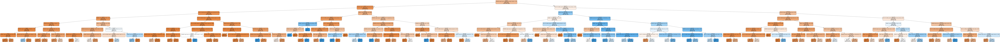

In [391]:
# display Decision Tree splits
dot_data = StringIO()  

export_graphviz(best_dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,\
                feature_names=X_train.columns,\
                node_ids=True)  

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [392]:
# create df showing features in order of impact on the model
importances_dt = pd.DataFrame(best_dtc.feature_importances_,
                                   index=X.columns,
                                   columns=['importance'])
importances_dt.sort_values(by='importance', ascending=False).head(10)

,importance
SQtA4i03_target_lang_can_maintain_conversation_familiar,0.336079
I09_ST_M_S48A_perceived_difficulty_target_lang_learning,0.257949
SQt31i04_target_lang_tv_no_subtitles_freq,0.076652
SQt31i09_target_lang_website_freq,0.051530
I09_ST_M_S33B_indicator_for_perception_usefulness_target_lan,0.032197
I08_ST_A_S19B_economic_social_cultural_status,0.028440
SQt31i01_target_lang_songs_freq,0.023179
SQt48i03_perceived_difficulty_target_lang_understanding,0.021923
SQt28i01_target_lang_level_father,0.019429
SQt33i01_target_lang_usefulness_travel,0.016555


### Random Forest Classifier

In [96]:
# initiate Random Forest model
rf = RandomForestClassifier(random_state=7)

# fit random forest model
rf.fit(X_train_ss, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=7, verbose=0, warm_start=False)

In [99]:
# set hyperparameters for gridsearch on random forest
params_rf = {'n_estimators':[30],
             'max_depth': [7, 10, 11, 20, 30],
             'max_features': [10, 20, 'log2', 'sqrt']}

In [100]:
# run gridsearch function for Random Forest
gs_rf = grid_search_func(rf, params_rf,\
                          X_train_ss, y_train, X_test_ss, y_test)

Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=30, total=   0.3s
[CV] max_depth=7, max_features=log2, n_estimators=30 .................
[CV] .... max_depth=7, max_features=10, n_estimators=30, total=   0.3s
[CV] max_depth=7, max_features=log2, n_estimators=30 .................
[CV] .... max_depth=7, max_features=10, n_estimators=30, total=   0.3s
[CV] .... max_de

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.7s


[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.3s
[CV] max_depth=11, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.5s
[CV] max_depth=11, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.4s
[CV] max_depth=11, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.4s
[CV] max_depth=11, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.4s
[CV] max_depth=11, max_features=log2, n_estimators=30 ................
[CV] . max_depth=11, max_features=log2, n_estimators=30, total=   0.3s
[CV] max_depth=11, max_features=sqrt, n_estimators=30 ................
[CV] . max_depth=11, max_features=log2, n_estimators=30, total=   0.3s
[CV] max_depth=11, max_features=sqrt, n_estimators=30 ................
[CV] .

[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    5.5s finished


Best score:
0.816

Best estimator:
{'bootstrap': True, 'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 30, 'n_jobs': 1, 'oob_score': False, 'random_state': 7, 'verbose': 0, 'warm_start': False}

Test score:  0.8093333333333333

Predicted     0    1   All
Actual                    
0          1833  208  2041
1           364  595   959
All        2197  803  3000

             precision    recall  f1-score   support

          0       0.83      0.90      0.87      2041
          1       0.74      0.62      0.68       959

avg / total       0.80      0.81      0.80      3000



In [ ]:
###

In [393]:
# create df showing features in order of impact on the model
importances = pd.DataFrame(list(zip(best_dtc.feature_importances_,\
                                    best_rf.feature_importances_,\
                                   )),index=X.columns, columns=['DecisionTree_importance',\
                                                                 'RandomForest_importance'])\
.sort_values('RandomForest_importance', ascending=False)
importances.head(20)

,DecisionTree_importance,RandomForest_importance
I09_ST_M_S33B_indicator_for_perception_usefulness_target_lan,0.032197,0.081570
I09_ST_M_S48A_perceived_difficulty_target_lang_learning,0.257949,0.076163
SQt48i03_perceived_difficulty_target_lang_understanding,0.021923,0.075479
SQt31i09_target_lang_website_freq,0.051530,0.057977
SQt31i02_target_lang_movies_no_subtitles_freq,0.002678,0.052395
I08_ST_A_S19B_economic_social_cultural_status,0.028440,0.048009
SQtA4i03_target_lang_can_maintain_conversation_familiar,0.336079,0.034787
HISEI_highest_occupational_status,0.014252,0.031811
SQtA4i04_target_lang_can_explain_viewpoint_advantages_d,0.000982,0.031258
SQt31i01_target_lang_songs_freq,0.023179,0.029108


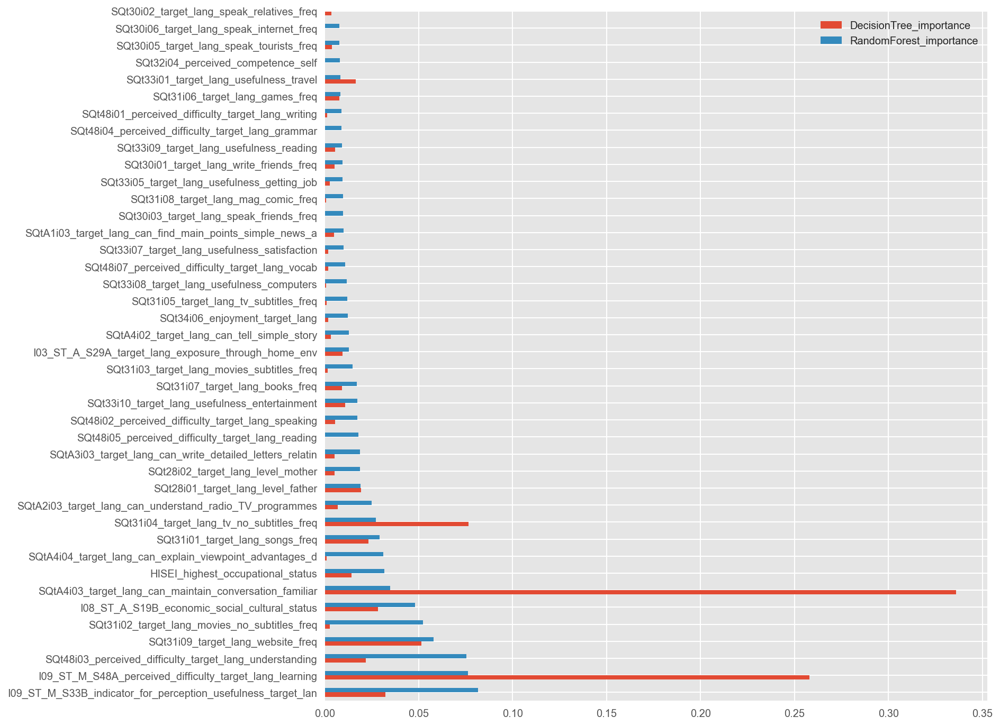

In [104]:
# plot feature importance to show difference between best Decision Tree and best Random Forest
fig, ax = plt.subplots(figsize=(10, 12))
importances.plot(kind='barh', ax=ax, fontsize=10, )
plt.ylim(ymax=40)
plt.legend(fontsize=10)
plt.show()

### Extra Trees

In [105]:
# instantiate Extra Trees Classifier model
etc = ExtraTreesClassifier(random_state=7)

# fit model
etc.fit(X_train_ss, y_train)

ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=7, verbose=0, warm_start=False)

In [106]:
# set hyperparameters for gridsearch on extra trees
params_etc = {'n_estimators':[30],
             'max_depth': [7, 10, 11, 20, 30],
             'max_features': [10, 20, 'log2', 'sqrt']}

In [107]:
# run gridsearch function for Extra Trees Classifier
gs_etc = grid_search_func(etc, params_etc,
                          X_train_ss, y_train, X_test_ss, y_test)

Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] max_depth=7, max_features=20, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=30, total=   0.3s
[CV] max_depth=7, max_features=log2, n_estimators=30 .................
[CV] .... max_depth=7, max_features=10, n_estimators=30, total=   0.3s
[CV] .... max_depth=7, max_features=10, n_estimators=30, total=   0.3s
[CV] max_depth=7, max_features=log2, n_estimators=30 .................
[CV] max_depth=7

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.5s


[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.3s
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.3s
[CV] max_depth=11, max_features=20, n_estimators=30 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.3s
[CV] max_depth=11, max_features=20, n_estimators=30 ..................
[CV] max_depth=11, max_features=20, n_estimators=30 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.3s
[CV] max_depth=11, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.4s
[CV] max_depth=11, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.4s
[CV] max_depth=11, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.4s
[CV] ... max_depth=11, max_features=10, n_estimators=30, total=   0.4s
[CV] m

[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    5.0s finished


Best score:
0.8128571428571428

Best estimator:
{'bootstrap': False, 'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'max_features': 20, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 30, 'n_jobs': 1, 'oob_score': False, 'random_state': 7, 'verbose': 0, 'warm_start': False}

Test score:  0.806

Predicted     0    1   All
Actual                    
0          1820  221  2041
1           361  598   959
All        2181  819  3000

             precision    recall  f1-score   support

          0       0.83      0.89      0.86      2041
          1       0.73      0.62      0.67       959

avg / total       0.80      0.81      0.80      3000



### Gaussian Naive Bayes

I won't run a gridsearch on this model as there are no hyperparameters to tune.

In [245]:
# instantiate Gaussian NB model
gnb = GaussianNB()

# fit model
gnb.fit(X_train_ss, y_train)

GaussianNB(priors=None)

In [246]:
# initiate model and cross validate
predictions_gnb = gnb.predict(X_test_ss)

print('Mean Cross Val Score:\t', cross_val_score(gnb, X_train_ss, y_train, cv=5).mean())
print('Score (Test Data):\t', bnb.score(X_test_ss, y_test))
print('Accuracy Score:\t', accuracy_score(y_test, predictions_bnb))

Mean Cross Val Score:	 0.7804285265305893
Score (Test Data):	 0.7626666666666667
Accuracy Score:	 0.7626666666666667


### MLPClassifier (Neural Network)

In [276]:
mlp = MLPClassifier(solver='lbfgs', alpha=10**(-6),
                    hidden_layer_sizes=(10,10,10), 
                    activation='identity',
                    random_state=7,
                    batch_size=100)
mlp.fit(X_train_ss, y_train)
accuracy_score(y_test, mlp.predict(X_test_ss))

0.8156666666666667

#### Action
My gridsearch on the MLP Classifier hung on a convergence warning so I tried a few different hyperparameters manually and settled on those in the instantiation above. As a follow up task, I need to work out how to get the gridsearch to run successfully.

In [260]:
# check number of layers
clf.n_layers_

5

In [333]:
# check number of coefs
print([coef.shape for coef in clf.coefs_])
print(sum([np.prod(coef.shape) for coef in clf.coefs_]))

[(58, 10), (10, 10), (10, 10), (10, 1)]
790


## Full Dataset (53k observations)

On the basis of the results from my gridsearch on the sample of data, I will now gridsearch on the two best performing models against the whole dataset to ensure they still perform well and to identify the best hyperparameters for larger amounts of data.

### Support Vector Classifier with rbf kernel (full dataset)

In [228]:
# instantiate SVM with rbf kernel
rbf_full = svm.SVC(kernel='rbf')

In [229]:
# create hyperparameter dictionary for gridsearch
params_rbf = {'C': np.logspace(-3,2,5),
              'gamma':np.logspace(-5,2,5)}

In [234]:
# run gridsearch function for SVM with rbf kernel
gs_rbf_full = grid_search_func(rbf_full, params_rbf,\
                          X_all_train_ss, y_all_train, X_all_test_ss, y_all_test)

Fitting 4 folds for each of 25 candidates, totalling 100 fits
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total= 2.1min
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total= 2.1min
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total= 2.1min
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............................. C=0.001, gamma=1e-05, total= 2.1min
[CV] C=0.001, g

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed: 17.5min


[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total= 1.8min
[CV] C=0.01778279410038923, gamma=1.7782794100389228 .................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total= 1.8min
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total= 1.8min
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total= 5.7min
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total= 5.7min
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total= 5.7min
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total= 5.7min
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .

[CV] ............. C=100.0, gamma=0.0005623413251903491, total= 2.3min
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=13.1min
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=14.7min
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=13.4min
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=14.8min
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=14.9min
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=14.9min
[CV] C=100.0, gamma=100.0 ............................................
[CV] .

[Parallel(n_jobs=6)]: Done 100 out of 100 | elapsed: 108.2min finished


Best score:
0.8220208252988817

Best estimator:
{'C': 100.0, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 0.0005623413251903491, 'kernel': 'rbf', 'max_iter': -1, 'probability': False, 'random_state': None, 'shrinking': True, 'tol': 0.001, 'verbose': False}

Test score:  0.822610707629025

Predicted      0     1    All
Actual                       
0           9826   854  10680
1           1906  2973   4879
All        11732  3827  15559

             precision    recall  f1-score   support

          0       0.84      0.92      0.88     10680
          1       0.78      0.61      0.68      4879

avg / total       0.82      0.82      0.82     15559



Note:
- Recall: the SVM model is doing significantly better at predicting low performance (0.92) than it is at predicting high performance (0.61). This means that of all the predicted high salaries, 92% of the predicted low salaries are correctly predicted. Low performance is the majority class so this could simply be a result of the model having access to twice the amount of data for that class. The overall recall of 0.82 is relatively high. Is it more important to correctly identify all students with potential to be high performers even if it means pushing those who are less likely to succeed? I feel like increasing the false positive rate would not serve in this situation.

- Precision: needs to be high in a situation where it is perhaps more important to incorrectly identify some high performers as low performers (ie. to push them even more) than to incorrectly tell students that they are already likely to be high performing and therefore maybe not push them as much. In the context of education where all students should be applying themselves, I feel that precision is more important than recall. This model is doing better at correctly predicting the high performers with fewer false negatives.

#### SVC for probabilities

I'd like to try and get a roc curve for the SVC model to compare performance against the random forest model. For the sake of expediency (because my gridsearches are taking a really long time) I will run the SVC without gridsearching but using the best parameters from the gridsearch I did earlier, set probability to 'True' so I can run .predict_proba afterwards and try to get the roc curve to work. I will clean this up and add the probability parameter to the gridsearch as one of the next steps after the course.

In [ ]:
# instantiate SVM model
clf_best = svm.SVC(C=100.0, cache_size=200, class_weight=None,\
                   coef0=0.0, decision_function_shape='ovr',\
                   degree=3, gamma=0.0005623413251903491,\
                   kernel='rbf', max_iter=-1, probability=True,\
                   random_state=7, shrinking=True, tol=0.001,\
                   verbose=2)

clf_best.fit(X_all_train_ss, y_all_train)

In [309]:
print(cross_val_score(clf_best, X_all_train_ss, y_all_train, cv=4, scoring='accuracy').mean())

0.8220207068329696


In [313]:
probabilities = clf_best.predict_proba

In [311]:
probabilities

<bound method BaseSVC._predict_proba of SVC(C=100.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.0005623413251903491,
  kernel='rbf', max_iter=-1, probability=True, random_state=7,
  shrinking=True, tol=0.001, verbose=False)>

### Random Forest with full dataset

In [247]:
# initiate Random Forest model
rf_full = RandomForestClassifier(random_state=7)

# fit random forest model
rf_full.fit(X_all_train_ss, y_all_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=7, verbose=0, warm_start=False)

In [250]:
# set hyperparameters for gridsearch on random forest
params_rf_full = {'n_estimators':[20, 30, 40],
             'max_depth': [7, 10, 11, 20, 30],
             'max_features': [10, 20, 'log2', 'sqrt']}

In [251]:
# run gridsearch function for Random Forest
gs_rf_full = grid_search_func(rf_full, params_rf_full,\
                          X_all_train_ss, y_all_train, X_all_test_ss, y_all_test)

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   1.1s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   1.2s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   1.2s
[CV] max_depth=7, max_features=10, n_estimators=40 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   1.2s
[CV] max_depth=

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:   11.1s


[CV] .... max_depth=7, max_features=20, n_estimators=40, total=   3.7s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .... max_depth=7, max_features=20, n_estimators=40, total=   3.7s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.9s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.9s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   1.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   1.4s
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   1.3s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .

[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   1.6s
[CV] max_depth=10, max_features=sqrt, n_estimators=40 ................
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   1.6s
[CV] max_depth=10, max_features=sqrt, n_estimators=40 ................
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   1.6s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   1.6s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   2.1s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   2.0s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   1.5s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] .

[CV] ... max_depth=20, max_features=10, n_estimators=20, total=   1.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=20, total=   1.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   2.5s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   2.6s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   2.5s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   2.5s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................


[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   55.9s


[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   3.4s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   3.4s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   2.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   2.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   3.4s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   3.4s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   2.9s
[CV] max_depth=20, max_features=20, n_estimators=40 ..................
[CV] .

[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   4.0s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   4.0s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   1.1s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   1.1s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   1.1s
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   1.0s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=30, max_features=20, n_estimators=40, total=   5.4s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] .

[Parallel(n_jobs=6)]: Done 240 out of 240 | elapsed:  1.6min finished


Best score:
0.8135915376563275

Best estimator:
{'bootstrap': True, 'class_weight': None, 'criterion': 'gini', 'max_depth': 11, 'max_features': 20, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 40, 'n_jobs': 1, 'oob_score': False, 'random_state': 7, 'verbose': 0, 'warm_start': False}

Test score:  0.8159264734237419

Predicted      0     1    All
Actual                       
0           9636  1044  10680
1           1820  3059   4879
All        11456  4103  15559

             precision    recall  f1-score   support

          0       0.84      0.90      0.87     10680
          1       0.75      0.63      0.68      4879

avg / total       0.81      0.82      0.81     15559



In [413]:
# create df showing features in order of impact on the model
importances_rf = pd.DataFrame(best_rf.feature_importances_,\
                              index=X_all_train.columns,\
                              columns=['importance'])\
                              .sort_values('importance', ascending=True)
importances_rf.head(20)

,importance
I03_ST_A_S26B_target_lang_used_home,0.002710
SQt29i06_target_lang_internet,0.002736
SQt26i05_lang_used_at_home_target,0.002923
SQtA1i02_target_lang_can_find_info_ads_timetables_reading,0.002993
SQt29i01_target_lang_exposure_penfriend,0.003007
SQtA2i02_target_lang_can_understand_if_spoken_slowly_cl,0.003821
SQtA1i04_target_lang_can_read_long_complex_texts_locati,0.003911
SQt29i07_target_lang_holidays,0.004086
SQtA2i01_target_lang_can_understand_qs_instructions_if,0.004256
SQtA3i04_target_lang_can_write_detailed_review_film_boo,0.004465


In [398]:
# set path to save importances to csv
path='/Users/lizspiking/GeneralAssembly/DSI5-lessons/projects/project-capstone/'

# save df to csv
importances_rf.to_csv(path + 'importances_rf.csv', sep=',', na_rep='', float_format=None,\
                 header=True, index=False, mode='w', encoding='UTF-8',\
                 compression=None, quoting=None, quotechar='"',\
                 line_terminator='\n', decimal='.')

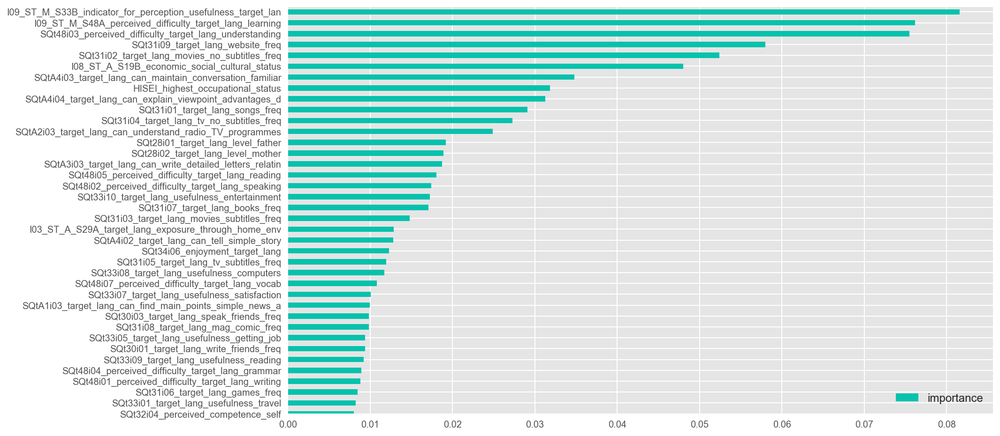

In [416]:
# plot feature importance to show difference between best Decision Tree and best Random Forest
fig, ax = plt.subplots(figsize=(12, 8))
importances_rf.plot(kind='barh', ax=ax, fontsize=10, color='xkcd:turquoise')
plt.ylim(ymin=20)
plt.legend(fontsize=12)
plt.show()
fig.savefig('/Users/lizspiking/Documents/Data Science/Capstone Project/Language/to.png')

In [315]:
gs_rf_full

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=11, max_features=20, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=40, n_jobs=1,
            oob_score=False, random_state=7, verbose=0, warm_start=False)

Note:
- All the scores are higher for the 0 class than they are for the 1 class, which means that model is doing better at predicting low performance than it is at predicting high performance. A contributing factor to this could be the fact that there is twice as much data for the low performance class in the dataset and therefore the model has been able to make use of more data to identify differentiating factors for the 0 class. To address this I could subset the data to be more evenly balanced between the two classes or I could use bootstrapping to increase the ratio of class 1 to class 0.

Recall:
- relates to the ratio of correctly predicted positives against all the positives in y_true (true positives out of all the true positives and false negatives). The higher the recall, the fewer instances there are of true positive values having been falsely predicted as negative which means that here, there is a higher likelihood of a high performer being incorrectly identified as a low performer than there is of a low performer being incorrectly identified as a high performer.
- The overall recall of 0.82 is the same as for the SVM model. Is it more important to correctly identify all students with potential to be high performers even if it means pushing those who are less likely to succeed? I feel like increasing the false positive rate would not serve in this situation.

Precision:
- relates to the ratio of correctly predicted positives against all the positives in y_pred (true positives out of everything predicted as positive (true positives and false positives)). The higher the precision, the fewer instances there are of negative values having falsely predicted as positive.  The precision needs to be high in a situation where it is perhaps preferable to incorrectly identify some high performers as low performers (ie. to push them even more) than to incorrectly tell low performing students that they are likely to be high performing and therefore maybe not push them as much. In the context of education where applying oneself is critical, I feel that precision is more important than recall.

## Model Evaluation

### Random Forest

In [304]:
# create a confusion matrix with cross_val_predict
predictions_rf = cross_val_predict(gs_rf_full, X_all_test, y_all_test, cv=4)
confusion_rf = confusion_matrix(y_all_test, predictions_rf)

Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=40 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    3.1s


[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.2s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.2s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=sqrt, n_estimators=40 .................
[CV] .

[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.6s
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.6s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] .

[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.9s
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.9s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   1.0s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................


[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   18.8s


[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.2s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.2s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   1.0s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   1.0s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.2s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.2s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   1.0s
[CV] max_depth=20, max_features=20, n_estimators=40 ..................
[CV] .

[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.4s
[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.4s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.4s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.4s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.4s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.4s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=30, max_features=20, n_estimators=40, total=   1.9s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] .

[Parallel(n_jobs=6)]: Done 240 out of 240 | elapsed:   33.7s finished


Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=40 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    3.2s


[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.2s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.2s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=sqrt, n_estimators=40 .................
[CV] .

[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.8s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] .

[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] max_depth=20, max_features=20, n_estimators=20 ..................


[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   18.0s


[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.0s
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=40 ..................
[CV] .

[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.2s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.2s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.4s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.4s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=30, max_features=20, n_estimators=40, total=   1.7s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] .

[Parallel(n_jobs=6)]: Done 240 out of 240 | elapsed:   31.5s finished


Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=10, n_estimators=40 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.3s
[CV] max_depth=

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    3.1s


[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.3s
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.2s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=sqrt, n_estimators=40 .................
[CV] .

[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.5s
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.7s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] .

[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................


[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   18.2s


[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=40 ..................
[CV] .

[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.3s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.3s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=30, max_features=20, n_estimators=40, total=   1.7s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] .

[Parallel(n_jobs=6)]: Done 240 out of 240 | elapsed:   32.1s finished


Fitting 4 folds for each of 60 candidates, totalling 240 fits
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=20 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.4s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.4s
[CV] max_depth=7, max_features=10, n_estimators=30 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.4s
[CV] max_depth=7, max_features=10, n_estimators=40 ...................
[CV] .... max_depth=7, max_features=10, n_estimators=20, total=   0.5s
[CV] max_depth=

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    3.0s


[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.2s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=20 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.2s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=log2, n_estimators=40, total=   0.4s
[CV] max_depth=7, max_features=sqrt, n_estimators=30 .................
[CV] .. max_depth=7, max_features=sqrt, n_estimators=20, total=   0.3s
[CV] max_depth=7, max_features=sqrt, n_estimators=40 .................
[CV] .

[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=30, total=   0.5s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.6s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.6s
[CV] max_depth=11, max_features=10, n_estimators=20 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.4s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] ... max_depth=11, max_features=10, n_estimators=20, total=   0.4s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] . max_depth=10, max_features=sqrt, n_estimators=40, total=   0.6s
[CV] max_depth=11, max_features=10, n_estimators=30 ..................
[CV] .

[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=10, n_estimators=40 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=30, total=   0.8s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................


[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   16.9s


[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=20 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=10, n_estimators=40, total=   1.1s
[CV] max_depth=20, max_features=20, n_estimators=30 ..................
[CV] ... max_depth=20, max_features=20, n_estimators=20, total=   0.9s
[CV] max_depth=20, max_features=20, n_estimators=40 ..................
[CV] .

[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.2s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] ... max_depth=30, max_features=20, n_estimators=30, total=   1.2s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=20 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] . max_depth=30, max_features=log2, n_estimators=20, total=   0.3s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] ... max_depth=30, max_features=20, n_estimators=40, total=   1.7s
[CV] max_depth=30, max_features=log2, n_estimators=30 ................
[CV] .

[Parallel(n_jobs=6)]: Done 240 out of 240 | elapsed:   30.3s finished


,0,1
0,9665,1015
1,1937,2942


In [305]:
# save as df
confusion_matrix_rf = pd.DataFrame(confusion_rf, columns=sorted(y_all_train.unique()),\
                                   index=sorted(y_all_train.unique()))
confusion_matrix_rf

,0,1
0,9665,1015
1,1937,2942


In [306]:
# calculate true/false positives and true/false negatives from Random Forest
tp = np.sum((y_all_test == 1) & (predictions_rf == 1))
fp = np.sum((y_all_test == 0) & (predictions_rf == 1))
tn = np.sum((y_all_test == 0) & (predictions_rf == 0))
fn = np.sum((y_all_test == 1) & (predictions_rf == 0))

print("tp:", tp)
print("fp:", fp)
print("tn:", tn) 
print("fn:", fn)
print("Number of classification errors:", fp+fn)

tp: 2942
fp: 1015
tn: 9665
fn: 1937
Number of classification errors: 2952


### SVC

In [332]:
gs_rbf_full.best_params_

{'C': 100.0, 'gamma': 0.0005623413251903491}

In [307]:
# create a confusion matrix with cross_val_predict
predictions_rbf = cross_val_predict(gs_rbf_full, X_all_test, y_all_test, cv=4)
confusion_rbf = confusion_matrix(y_all_test, predictions_rbf)

Fitting 4 folds for each of 25 candidates, totalling 100 fits
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  12.2s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  12.3s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  12.3s
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............................. C=0.001, gamma=1e-05, total=  12.4s
[CV] C=0.001, g

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:  1.7min


[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  12.9s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  12.8s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  24.5s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  24.4s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  24.6s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  24.5s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] ............... C=0.01778279410038923, gamma=100.0, total=  21.4s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .

[CV] ............... C=100.0, gamma=0.03162277660168379, total=  23.1s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  25.3s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  25.0s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  25.4s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total= 1.1min
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total= 1.0min
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............................. C=100.0, gamma=100.0, total=  45.6s
[CV] ............................. C=100.0, gamma=100.0, total=  49.3s
[CV] .

[Parallel(n_jobs=6)]: Done 100 out of 100 | elapsed:  7.9min finished


Fitting 4 folds for each of 25 candidates, totalling 100 fits
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.6s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.7s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.7s
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.7s
[CV] C=0.001, g

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:  1.6min


[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  11.6s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  11.6s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  21.3s
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  21.4s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  20.9s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  20.9s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] ............... C=0.01778279410038923, gamma=100.0, total=  17.2s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .

[CV] ............... C=100.0, gamma=0.03162277660168379, total=  24.4s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  24.7s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  22.3s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  22.6s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=  59.5s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=  60.0s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............................. C=100.0, gamma=100.0, total=  42.0s
[CV] ............................. C=100.0, gamma=100.0, total=  42.6s
[CV] .

[Parallel(n_jobs=6)]: Done 100 out of 100 | elapsed:  7.4min finished


Fitting 4 folds for each of 25 candidates, totalling 100 fits
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.1s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.1s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.2s
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.2s
[CV] C=0.001, g

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:  1.5min


[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  10.8s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  10.8s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  20.4s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  20.6s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  20.5s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  20.6s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] ............... C=0.01778279410038923, gamma=100.0, total=  16.9s
[CV] ............... C=0.01778279410038923, gamma=100.0, total=  16.7s
[CV] C

[CV] ............... C=100.0, gamma=0.03162277660168379, total=  22.3s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  22.1s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  22.2s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  22.2s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=  54.5s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=  55.1s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............................. C=100.0, gamma=100.0, total=  46.1s
[CV] ............................. C=100.0, gamma=100.0, total=  46.0s
[CV] .

[Parallel(n_jobs=6)]: Done 100 out of 100 | elapsed:  7.1min finished


Fitting 4 folds for each of 25 candidates, totalling 100 fits
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=1e-05 ............................................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.8s
[CV] ............................. C=0.001, gamma=1e-05, total=  11.9s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.9s
[CV] C=0.001, gamma=0.0005623413251903491 ............................
[CV] C=0.001, gamma=0.03162277660168379 ..............................
[CV] ............................. C=0.001, gamma=1e-05, total=  11.9s
[CV] C=0.001, g

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:  1.6min


[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  12.1s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] . C=0.01778279410038923, gamma=0.03162277660168379, total=  12.2s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  22.9s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  22.9s
[CV] C=0.01778279410038923, gamma=100.0 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  22.3s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .. C=0.01778279410038923, gamma=1.7782794100389228, total=  22.5s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] ............... C=0.01778279410038923, gamma=100.0, total=  18.7s
[CV] C=0.31622776601683794, gamma=1e-05 ..............................
[CV] .

[CV] ............... C=100.0, gamma=0.03162277660168379, total=  21.6s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  21.8s
[CV] C=100.0, gamma=1.7782794100389228 ...............................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  21.6s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............... C=100.0, gamma=0.03162277660168379, total=  21.7s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=  57.2s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ................ C=100.0, gamma=1.7782794100389228, total=  57.1s
[CV] C=100.0, gamma=100.0 ............................................
[CV] ............................. C=100.0, gamma=100.0, total=  45.8s
[CV] ............................. C=100.0, gamma=100.0, total=  45.2s
[CV] .

[Parallel(n_jobs=6)]: Done 100 out of 100 | elapsed:  7.4min finished


In [336]:
# save as df
confusion_matrix_rbf = pd.DataFrame(confusion_rbf, columns=sorted(y_all_train.unique()),\
                                   index=sorted(y_all_train.unique()))
confusion_matrix_rbf

,0,1
0,9750,930
1,1953,2926


In [338]:
# calculate true/false positives and true/false negatives from SVM
tp_svm = np.sum((y_all_test == 1) & (predictions_rbf == 1))
fp_svm = np.sum((y_all_test == 0) & (predictions_rbf == 1))
tn_svm = np.sum((y_all_test == 0) & (predictions_rbf == 0))
fn_svm = np.sum((y_all_test == 1) & (predictions_rbf == 0))

print("tp:", tp_svm)
print("fp:", fp_svm)
print("tn:", tn_svm) 
print("fn:", fn_svm)
print("Number of classification errors:", fp_svm+fn_svm)

tp: 2926
fp: 930
tn: 9750
fn: 1953
Number of classification errors: 2883


## ROC Curve

In [341]:
# create dataframe to adjust threshold
thresholds_rf = pd.DataFrame({'y_true': y_all_test,
                              'y_hat': predictions_rf,
                              'prob_1':gs_rf_full.predict_proba(X_all_test)[:,1]})

thresholds_rf['60%_threshold'] = thresholds_rf['prob_1'].map(lambda x: 1 if x>0.6 else 0)
thresholds_rf['40%_threshold'] = thresholds_rf['prob_1'].map(lambda x: 1 if x>0.4 else 0)
thresholds_rf.head(10)

,prob_1,y_hat,y_true,60%_threshold,40%_threshold
14478,0.602478,1,1,1,1
17620,0.636620,1,1,1,1
24880,0.417036,0,0,0,1
22809,0.474927,0,0,0,1
9576,0.476759,0,0,0,1
35509,0.679132,1,1,1,1
358,0.343376,0,0,0,0
25077,0.405597,0,0,0,1
44120,0.692393,1,1,1,1
17478,0.698539,1,1,1,1


In [318]:
# create dataframe to show FPR and TPR against each corresponding threshold
fpr, tpr, threshold = roc_curve(y_all_test,thresholds_rf['prob_1'])
fpr_tpr_df = pd.DataFrame({'FPR':fpr,'TPR':tpr,'Threshold':threshold})

In [323]:
# review df
fpr_tpr_df.head()

,FPR,TPR,Threshold
0,0.000000,0.000205,0.826292
1,0.000000,0.001025,0.814135
2,0.000094,0.001025,0.812332
3,0.000094,0.001845,0.807098
4,0.000187,0.001845,0.806927


In [346]:
# create dataframe to adjust threshold
thresholds_svm = pd.DataFrame({'y_true': y_all_test,
                              'y_hat': predictions_rbf,
                              'prob_1':gs_rf_full.predict_proba(X_all_test)[:,1]})

thresholds_svm['70%_threshold'] = thresholds_svm['prob_1'].map(lambda x: 1 if x>0.7 else 0)
thresholds_svm['30%_threshold'] = thresholds_svm['prob_1'].map(lambda x: 1 if x>0.3 else 0)
thresholds_svm.head(10)

,prob_1,y_hat,y_true,70%_threshold,30%_threshold
14478,0.602478,1,1,0,1
17620,0.636620,1,1,0,1
24880,0.417036,0,0,0,1
22809,0.474927,0,0,0,1
9576,0.476759,0,0,0,1
35509,0.679132,0,1,0,1
358,0.343376,0,0,0,1
25077,0.405597,0,0,0,1
44120,0.692393,1,1,0,1
17478,0.698539,1,1,0,1


In [347]:
# create dataframe to show FPR and TPR against each corresponding threshold
fpr_svm, tpr_svm, threshold_svm = roc_curve(y_all_test,thresholds_svm['prob_1'])
fpr_tpr_svm = pd.DataFrame({'FPR':fpr_svm,'TPR':tpr_svm,'Threshold':threshold_svm})

In [348]:
# review df
fpr_tpr_svm.head()

,FPR,TPR,Threshold
0,0.000000,0.000205,0.826292
1,0.000000,0.001025,0.814135
2,0.000094,0.001025,0.812332
3,0.000094,0.001845,0.807098
4,0.000187,0.001845,0.806927


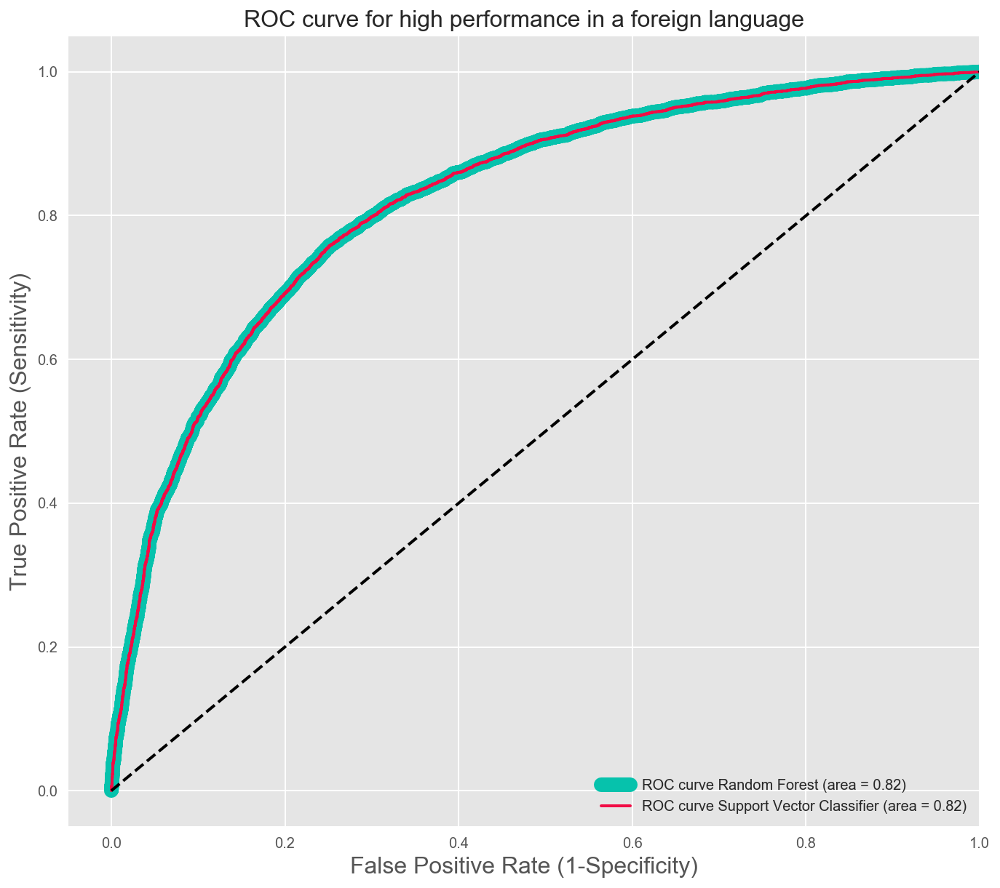

In [420]:
# For high performance, find the area under the curve
roc_auc_rf = auc(fpr, tpr)
roc_auc_svm = auc(fpr_svm, tpr_svm)

# Plot ROC curve for class 1 (high performance)
plt.figure(figsize=[10,10])
# ROC curve for Random Forest model
_ = plt.plot(fpr, tpr, label='ROC curve Random Forest (area = %0.2f)' % roc_auc_rf, linewidth=10, color='xkcd:turquoise')
# ROC curve for SVM model
_ = plt.plot(fpr_svm, tpr_svm, label='ROC curve Support Vector Classifier (area = %0.2f)' % roc_auc_svm, linewidth=2, color='xkcd:pinkish red')

plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.xlim([-0.05, 1.0])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate (1-Specificity)', fontsize=16)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=16)
plt.title('ROC curve for high performance in a foreign language', fontsize=16)
plt.legend(loc="lower right")
plt.show()

Note:
- The ROC curve for both models is pretty smooth with the sharpest increase in true positive rate up to a false positive rate of around 0.3. After that point the gains in true positives slows and the false posiitve rate increases much faster for each small increment in the TPR. A specificity of 0.7 would be the optimum here as it would prevent too many students from the low performing class being mis-identified as being in the high performing class while still correctly identifying 80% of the high performing students.
- I am concerned that the two curves are so similar; the results for each model are very close to each other but I would welcome any tips on how I could check both results to ensure that the similarity isn't a mistake!

## Simple Pipeline

As the results are so similar between the two models and a Random Forest is easier to explain, I will put that into the pipeline.

In [360]:
# instantiate pipeline
rf_pipeline = Pipeline([('ss',StandardScaler()),
                        #('pca',PCA()),
                        ('rfr',RandomForestClassifier())])

# set gridsearch hyperparameters
rfp_params = {
            #'pca__n_components': (17,20,25,None),
            'rfr__n_estimators': [20, 30, 40],        
            'rfr__max_depth': [7, 10, 11, 20, 30],
            'rfr__max_features': [10, 20, 'log2', 'sqrt']
            }

In [371]:
# instantiate gridsearch on pipeline
gs_pl = GridSearchCV(rf_pipeline, rfp_params, n_jobs=6, verbose=2)

print("Performing grid search...")
print("pipeline:", [name for name, _ in rf_pipeline.steps])
print("parameters:")
print(rfp_params)
gs_pl.fit(X_train, y_train) # this is running on the subset of 10000 observations for expediency
print()

print("Best score: %0.3f" % gs_pl.best_score_)
print("Best parameters set:")
best_parameters = gs_pl.best_estimator_.get_params()
for param_name in sorted(rfp_params.keys()):
    print("\t%s: %r" % (param_name, best_parameters[param_name]))

Performing grid search...
pipeline: ['ss', 'rfr']
parameters:
{'rfr__n_estimators': [20, 30, 40], 'rfr__max_depth': [7, 10, 11, 20, 30], 'rfr__max_features': [10, 20, 'log2', 'sqrt']}
Fitting 3 folds for each of 60 candidates, totalling 180 fits
[CV] rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=20 ....
[CV] rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=20 ....
[CV] rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=20 ....
[CV] rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=30 ....
[CV] rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=30 ....
[CV] rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=30 ....
[CV]  rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=20, total=   0.2s
[CV] rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=40 ....
[CV]  rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=20, total=   0.2s
[CV]  rfr__max_depth=7, rfr__max_features=10, rfr__n_estimators=20, total=   0.2s
[CV] rfr__m

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    1.7s


[CV]  rfr__max_depth=7, rfr__max_features=sqrt, rfr__n_estimators=40, total=   0.3s
[CV] rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=30 ...
[CV]  rfr__max_depth=7, rfr__max_features=sqrt, rfr__n_estimators=40, total=   0.3s
[CV]  rfr__max_depth=7, rfr__max_features=sqrt, rfr__n_estimators=40, total=   0.3s
[CV] rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=30 ...
[CV] rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=30 ...
[CV]  rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=20, total=   0.2s
[CV]  rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=20, total=   0.2s
[CV] rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=40 ...
[CV]  rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=20, total=   0.2s
[CV] rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=40 ...
[CV] rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=40 ...
[CV]  rfr__max_depth=10, rfr__max_features=10, rfr__n_estimators=30, tota

[CV]  rfr__max_depth=11, rfr__max_features=20, rfr__n_estimators=30, total=   0.6s
[CV] rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=20 .
[CV]  rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=20, total=   0.2s
[CV] rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=30 .
[CV]  rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=20, total=   0.2s
[CV]  rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=20, total=   0.2s
[CV] rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=30 .
[CV] rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=30 .
[CV]  rfr__max_depth=11, rfr__max_features=20, rfr__n_estimators=40, total=   0.7s
[CV] rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=40 .
[CV]  rfr__max_depth=11, rfr__max_features=20, rfr__n_estimators=40, total=   0.8s
[CV] rfr__max_depth=11, rfr__max_features=log2, rfr__n_estimators=40 .
[CV]  rfr__max_depth=11, rfr__max_features=20, rfr__n_estimators=40, t

[CV]  rfr__max_depth=20, rfr__max_features=sqrt, rfr__n_estimators=30, total=   0.4s
[CV] rfr__max_depth=30, rfr__max_features=10, rfr__n_estimators=20 ...
[CV]  rfr__max_depth=20, rfr__max_features=sqrt, rfr__n_estimators=30, total=   0.4s
[CV] rfr__max_depth=30, rfr__max_features=10, rfr__n_estimators=20 ...
[CV]  rfr__max_depth=20, rfr__max_features=sqrt, rfr__n_estimators=40, total=   0.4s
[CV] rfr__max_depth=30, rfr__max_features=10, rfr__n_estimators=30 ...
[CV]  rfr__max_depth=20, rfr__max_features=sqrt, rfr__n_estimators=40, total=   0.5s
[CV] rfr__max_depth=30, rfr__max_features=10, rfr__n_estimators=30 ...
[CV]  rfr__max_depth=20, rfr__max_features=sqrt, rfr__n_estimators=40, total=   0.5s
[CV]  rfr__max_depth=30, rfr__max_features=10, rfr__n_estimators=20, total=   0.3s
[CV] rfr__max_depth=30, rfr__max_features=10, rfr__n_estimators=30 ...
[CV]  rfr__max_depth=30, rfr__max_features=10, rfr__n_estimators=20, total=   0.3s
[CV] rfr__max_depth=30, rfr__max_features=10, rfr__n_e

[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   10.9s


[CV]  rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=20, total=   0.5s
[CV] rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=40 ...
[CV]  rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=20, total=   0.5s
[CV] rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=40 ...
[CV]  rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=20, total=   0.5s
[CV] rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=40 ...
[CV]  rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=30, total=   0.7s
[CV]  rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=30, total=   0.7s
[CV]  rfr__max_depth=30, rfr__max_features=20, rfr__n_estimators=30, total=   0.8s
[CV] rfr__max_depth=30, rfr__max_features=log2, rfr__n_estimators=20 .
[CV] rfr__max_depth=30, rfr__max_features=log2, rfr__n_estimators=20 .
[CV] rfr__max_depth=30, rfr__max_features=log2, rfr__n_estimators=20 .
[CV]  rfr__max_depth=30, rfr__max_features=log2, rfr__n_estimators=20, total

[Parallel(n_jobs=6)]: Done 180 out of 180 | elapsed:   13.4s finished



Best score: 0.814
Best parameters set:
	rfr__max_depth: 10
	rfr__max_features: 'sqrt'
	rfr__n_estimators: 30


In [377]:
# review best mean cross-validated score on training data
print('Mean cross val score against training set:\t')
print(gs_pl.best_score_.round(3))

# score model against test set
print('Best score against test set:\t')
print(gs_pl.score(X_test, y_test))

# make predictions against the test set
print('Predictions for test set:\t')
print(gs_pl.predict(X_test))

Mean cross val score against training set:	
0.814
Best score against test set:	
0.804
Predictions for test set:	
[0 1 0 ... 0 1 0]


## Next Steps

There are a number of things I want to do on this project which I have run out of time for but which I will look at subsequently:

- follow up on the gridsearches that were hanging and tune them sufficiently to allow them to run successfully
- multiclass model (SVM?)
- make a final decision about adding some more features to the train/test data set and run models against that data if so
- run models against my the PCA (and add to pipeline if beneficial)
- use best performing models to predict discipline-specific results to see how they perform and whether there are features that are specifically contribute to performance in each discipline, rather than simply overall
- write a transformer to streamline the data cleaning/standardisation process
- update the pipeline to make the transformer and final model production ready

## PARKING LOT

This section contains code snippets for things I have tried/want to include in my next steps.

In [ ]:
# subset df to students tested on listening and writing
#list_writ = lang.loc[(lang['PL_LIST'] != 'Not Tested') & (lang['PL_WRIT'] != 'Not Tested')].copy()

In [ ]:
# subset df to students tested on reading and writing
#read_writ = lang.loc[(lang['PL_READ'] != 'Not Tested') & (lang['PL_WRIT'] != 'Not Tested')].copy()

In [ ]:
# subset df to students tested on listening and reading
#list_read = lang.loc[(lang['PL_LIST'] != 'Not Tested') & (lang['PL_READ'] != 'Not Tested')].copy()

### Reading Subset

In [22]:
# create reading train/test split
X_read_train, X_read_test, y_read_train, y_read_test = train_test_split(X_read, y_read,\
                                                                        test_size=0.3,\
                                                                        shuffle=True, random_state=7)

In [23]:
# instantiate StandardScaler and apply to predictors
ss = StandardScaler()
X_read_train_ss = ss.fit_transform(X_read_train)
X_read_test_ss = ss.transform(X_read_test)

### Writing Subset

In [24]:
# create writing train/test split
X_writ_train, X_writ_test, y_writ_train, y_writ_test = train_test_split(X_writ, y_writ,\
                                                                        test_size=0.3,\
                                                                        shuffle=True, random_state=7)

In [25]:
# instantiate StandardScaler and apply to predictors
ss = StandardScaler()
X_writ_train_ss = ss.fit_transform(X_writ_train)
X_writ_test_ss = ss.transform(X_writ_test)

### MLP Classifier Gridsearch

In [277]:
# set hyperparameters for gridsearch on MLP Classifier
#params_mlp = {'solver':['adam', 'lbfgs'],
#              'activation':['relu', 'identity']}

In [278]:
# run gridsearch for MLP Classifier
#gs_mlp = grid_search_func(mlp, params_mlp,\
#                          X_train_ss, y_train, X_test_ss, y_test)

Possible alternative to gridsearching? For loop:
    - for C in [values]:
        for l in [l1, l2]:
            ... add scores to list 